In [ ]:
import pickle 
# import os

import numpy as np
import jax.numpy as jnp

import matplotlib.pyplot as plt

from loco_mujoco.evaluation.evaluation_prosthesis import PostProcessMetricsHandler

# import importlib

# importlib.reload(importlib.import_module("evaluation_prosthesis"))

postprocess_handler = PostProcessMetricsHandler()



# from evaluation_prosthesis import ProsthesisMetricsHandler
# from loco_mujoco import TaskFactory
# from loco_mujoco.algorithms import PPOJax

# import mujoco
# from omegaconf import OmegaConf

# from loco_mujoco.core.wrappers import VecEnv

output_path = "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250614_015126_evaluation_results_1000steps.pkl" # Add pkl file path here 

min_walk_step_length = 10 #40 

# model = mjModel.from_xml_path("prosthesis_model.xml")


# os.environ["MUJOCO_GL"] = "egl"  # Use EGL for rendering, which is more compatible with headless environments
# os.environ["JAX_PLATFORMS"] = "cpu"
# os.environ['XLA_FLAGS'] = (
#     '--xla_gpu_triton_gemm_any=True ')


# # Use the path from command line arguments
# path = "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/PPOJax_saved.pkl"
# agent_conf, agent_state = PPOJax.load_agent(path)
# config = agent_conf.config

# # get task factory
# factory = TaskFactory.get_factory_cls(config.experiment.task_factory.name)

# # create env
# OmegaConf.set_struct(config, False)  # Allow modifications
# config.experiment.env_params["headless"] = True #False
# config.experiment.env_params["goal_type"] = "GoalTrajMimicv2"   # nicer looking than GoalTrajMimic
# config.experiment.env_params["add_sensors"] = True
# env = factory.make(**config.experiment.env_params, **config.experiment.task_factory.params)
# env.th.to_jax()
# env = VecEnv(env)
# model = env.get_model()

chosen_joint_names = ["hip_flexion", "knee_angle", "ankle_angle", "subtalar_angle", "mtp_angle"]
all_chosen_joint_names = [f"{name}_l" for name in chosen_joint_names] + [f"{name}_r" for name in chosen_joint_names] + ["lumbar_extension"]
# joint_names = []
# for i in range(model.njnt):
#     joint_name = mujoco.mj_id2name(model, mujoco.mjtObj.mjOBJ_JOINT, i)
#     joint_names.append(joint_name)

# final_joint_name = []
# for j in joint_names: 
#     if j in all_chosen_joint_names:
#         final_joint_name.append(j)


/home/nadinebadie/anaconda3/envs/loco-mujoco/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Prosthesis side: _l
Prosthesis type: transtibial


100%|██████████| 35200/35200 [00:15<00:00, 2205.83it/s]


Loaded trajectory


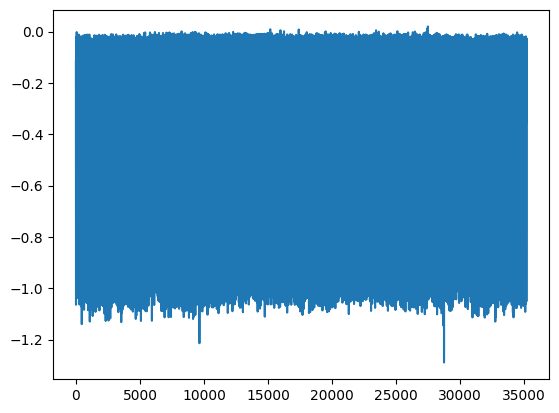

In [2]:
# Load data trajectory for baseline 
dataset_task = "walk"
dataset_type = "mocap"
dataset_debug = False
dataset_envname = "SkeletonMuscle"
# task_factory_name = "ImitationFactory"

from loco_mujoco.task_factories.dataset_confs import DefaultDatasetConf
from loco_mujoco.trajectory import Trajectory, TrajectoryHandler
from loco_mujoco.smpl.retargeting import extend_motion, load_robot_conf_file
from huggingface_hub import hf_hub_download
from loco_mujoco import ImitationFactory
trajs = []
env = ImitationFactory.make("MjxSkeletonMuscleProsthesis", prosthesis_side ="left_side", prosthesis_type="transtibial", default_dataset_conf=dict(task="walk"))
default_dataset_conf = DefaultDatasetConf(dataset_task, dataset_type, dataset_debug)
env_name = "SkeletonMuscle"
# with open(path_to_conf, "r") as file:
#     data = yaml.load(file, Loader=yaml.FullLoader)
#     path_to_convert_default_datasets = data["LOCOMUJOCO_CONVERTED_DEFAULT_PATH"]
#     os.makedirs(path_to_convert_default_datasets, exist_ok=True)

file_path = f"{dataset_type}/{dataset_envname}/{dataset_task}.npz"

filename = f"DefaultDatasets/{file_path}"

file_path = hf_hub_download(
    repo_id="robfiras/loco-mujoco-datasets",
    filename=filename,
    repo_type="dataset"
)

traj = Trajectory.load(file_path)
# extend the motion to the desired length
if not traj.data.is_complete:
    traj = extend_motion(env_name, load_robot_conf_file(env_name).env_params, traj)

# pass the default trajectory through a TrajectoryHandler to interpolate it to the environment frequency
# and to filter out or add necessary entities is needed
default_th = TrajectoryHandler(env.model, control_dt=env.dt, traj=traj)

trajs.append(default_th.traj)
# print(trajs.data.qpos.shape)
# print(trajs.data.qpos)
print(f"Loaded trajectory")
# traj = Trajectory.concatenate(traj)
plt.plot(traj.data.qpos[:,15])

In [ ]:
# Save all trajs 
file_name = "/home/nadinebadie/loco-mujoco/prosthesis_test/all_trajs_walk_SkeletonMuscle.pkl"
with open(file_name, "wb") as f:
    pickle.dump(trajs, f)

In [ ]:
# # METHODS for Step Detection and Parameter Extraction
# def get_start_steps(all_step_contact, min_walk_step_length):
#     """
#     Get the start steps for left and right foot based on contact data.
#     This function processes the contact data to determine the start of each step.
#     Args:
#     all_step_contact (list): A list of contact indices where steps occur.
#     min_walk_step_length (int): The minimum length of a walk step to consider it valid.
#     """
#     # Initialize lists to store the start steps for left and right foot
#     # if all_step_contact[0]!= 0:
#     all_step_start  = []
#     # if all_step_contact:
#     if all_step_contact[0]!= 0:
#         all_step_start = [all_step_contact[0]]

#     # print('length of all_step_contact:', len(all_step_contact))

#     # Iterate through the contact data to find non-consecutive steps
#     for m in range(len(all_step_contact) - 1):
#         # print("m", m)

#         if all_step_contact[m + 1] - all_step_contact[m] > min_walk_step_length:
#             all_step_start.append(all_step_contact[m+1])
    
#     # print(f"All start steps: {all_step_start}")


#     return all_step_start




# # def filter_start_step_indices(all_step_start, min_walk_step_length):
# #         """
# #         Filter the start step indices to ensure they are sufficiently spaced apart.
# #         This function removes start steps that are too close together, based on a minimum step length.
        
# #         Args:
# #         all_step_start (list): The list of start step indices.
# #         min_walk_step_length (int): The minimum length of a walk step to consider it valid.

# #         Returns:
# #         list: A filtered list of start step indices.
# #         """
# #         # if difference between start_step[i] and start_step[i+1] is smaller than 50 than delete start_step[i]
# #         filtered_start_steps = []
# #         filtered_start_steps.append(all_step_start[0])  # Always keep the first step
# #         for i in range(len(all_step_start) - 1):
# #             if all_step_start[i + 1] - all_step_start[i] > min_walk_step_length:
# #                 filtered_start_steps.append(all_step_start[i+1])

# #         return filtered_start_steps





# # def get_parameter_per_step(parameter_data, start_indices):
# #     """
# #     Get the parameter values for each step based on the start indices until the next start index -1 .
# #     This function extracts the specified parameter values from the saved parameter data.
    
# #     Args:
# #     chosen_parameter (str): The parameter to extract. Options: "joint_angles", "joint_velocities", "joint_forces", "joint_torques", "muscle_actions".
# #     start_indices (list): The start indices of the steps.

# #     Returns:
# #     list: A list of parameter values for each step.
# #     """
# #     all_parameter_per_step = []
    
# #     for i in range(len(start_indices) - 1):
# #         start_index = start_indices[i]
# #         end_index = start_indices[i + 1] - 1

# #         parameter_per_step = parameter_data[start_index:end_index]  # Extract the parameter values for the step

# #         parameter_per_step = jnp.array(parameter_per_step)  # Convert to JAX array for further processing
# #         all_parameter_per_step.append(parameter_per_step)  # Append the parameter values for the step to the list
    
# #     return all_parameter_per_step


# def plot_parameter_per_step(
#     data,
#     step_indices_left,
#     step_indices_right,
#     param_name="parameter",
#     interp_mode="none",
#     interp_len=None,
#     columns=None,
#     ylabel=None,
#     title=None,
#     legend_prefix="",
#     deg=False,
# ):
#     """
#     Plots a parameter (e.g., joint angle, sensor data) over steps for left and right sides.
#     Args:
#         data: list or dict. If dict, keys are names (e.g., joint names), values are lists/arrays.
#         step_indices_left: list of int, start indices for left steps.
#         step_indices_right: list of int, start indices for right steps.
#         param_name: str, name for labeling.
#         interp_mode: "none" or "interp". If "interp", interpolate to interp_len.
#         interp_len: int, length to interpolate to (if None, use shortest step).
#         columns: list of int, columns to plot if data is multidimensional. [x,y,z] --> [0,1,2] for 3D data.
#         ylabel: str, y-axis label.
#         title: str, plot title.
#         legend_prefix: str, prefix for legend.
#         deg: bool, if True, convert radians to degrees.
#     """

#     def get_step_slices(data, step_indices):
#         steps = []
#         for i in range(len(step_indices) - 1):
#             start = step_indices[i]
#             end = step_indices[i + 1]
#             steps.append(data[start:end])
#         return steps

#     # If data is dict, plot each key separately
#     if isinstance(data, dict):
#         nplots = len(data)
#         fig, axes = plt.subplots(nplots, 1, figsize=(10, 3 * nplots), sharex=True)
#         if nplots == 1:
#             axes = [axes]
#         for ax, (key, arr) in zip(axes, data.items()):
#             plot_parameter_per_step(
#                 arr,
#                 step_indices_left,
#                 step_indices_right,
#                 param_name=param_name,
#                 interp_mode=interp_mode,
#                 interp_len=interp_len,
#                 columns=columns,
#                 ylabel=ylabel or param_name,
#                 title=title or key,
#                 legend_prefix=key + " ",
#                 deg=deg,
#             )
#             ax.set_title(key)
#         plt.tight_layout()
#         plt.show()
#         return

#     # If data is a list of arrays (e.g., all_tibia_sensor_data)
#     if isinstance(data, list) and len(data) > 0 and hasattr(data[0], "shape"):
#         arr0 = data[0]
#         arr0 = np.array(arr0)
#         ncols = arr0.shape[-1] if arr0.ndim > 1 else 1
#         # --- ADAPTATION: allow columns as int or list ---
#         if columns is None:
#             columns = list(range(ncols))
#         elif isinstance(columns, int):
#             columns = [columns]
#         nplots = len(columns)
#         fig, axes = plt.subplots(nplots, 1, figsize=(10, 3 * nplots), sharex=True)
#         if nplots == 1:
#             axes = [axes]
#         for idx, col in enumerate(columns):
#             ax = axes[idx]
#             # Plot left steps
#             if step_indices_left and len(step_indices_left) > 1:
#                 steps = get_step_slices(data, step_indices_left)
#                 for i, step in enumerate(steps):
#                     y = [float(np.array(a)[0, col] if np.array(a).ndim > 1 else np.array(a)[col]) for a in step]
#                     if len(y) < 2:
#                         continue
#                     if interp_mode == "interp":
#                         x_old = np.linspace(0, 1, len(y))
#                         x_new = np.linspace(0, 1, interp_len or min([len(s) for s in steps if len(s) > 1]))
#                         y = np.interp(x_new, x_old, y)
#                     if deg:
#                         y = np.rad2deg(y)
#                     ax.plot(y, label=f"{legend_prefix}left step {i+1}")
#             # Plot right steps
#             if step_indices_right and len(step_indices_right) > 1:
#                 steps = get_step_slices(data, step_indices_right)
#                 for i, step in enumerate(steps):
#                     y = [float(np.array(a)[0, col] if np.array(a).ndim > 1 else np.array(a)[col]) for a in step]
#                     if len(y) < 2:
#                         continue
#                     if interp_mode == "interp":
#                         x_old = np.linspace(0, 1, len(y))
#                         x_new = np.linspace(0, 1, interp_len or min([len(s) for s in steps if len(s) > 1]))
#                         y = np.interp(x_new, x_old, y)
#                     if deg:
#                         y = np.rad2deg(y)
#                     ax.plot(y, label=f"{legend_prefix}right step {i+1}")
#             ax.set_ylabel(ylabel or f"{param_name} col {col}")
#             ax.legend()
#             ax.set_title(title or f"{param_name} col {col}")
#         axes[-1].set_xlabel("Interpolated Step (%)" if interp_mode == "interp" else "Step index")
#         plt.tight_layout()
#         plt.show()
#         return

#     # Otherwise, treat as 1D data
#     fig, ax = plt.subplots(figsize=(10, 3))
#     if step_indices_left and len(step_indices_left) > 1:
#         steps = get_step_slices(data, step_indices_left)
#         for i, step in enumerate(steps):
#             y = [float(a) for a in step]
#             if len(y) < 2:
#                 continue
#             if interp_mode == "interp":
#                 x_old = np.linspace(0, 1, len(y))
#                 x_new = np.linspace(0, 1, interp_len or min([len(s) for s in steps if len(s) > 1]))
#                 y = np.interp(x_new, x_old, y)
#             if deg:
#                 y = np.rad2deg(y)
#             ax.plot(y, label=f"{legend_prefix}left step {i+1}")
#     if step_indices_right and len(step_indices_right) > 1:
#         steps = get_step_slices(data, step_indices_right)
#         for i, step in enumerate(steps):
#             y = [float(a) for a in step]
#             if len(y) < 2:
#                 continue
#             if interp_mode == "interp":
#                 x_old = np.linspace(0, 1, len(y))
#                 x_new = np.linspace(0, 1, interp_len or min([len(s) for s in steps if len(s) > 1]))
#                 y = np.interp(x_new, x_old, y)
#             if deg:
#                 y = np.rad2deg(y)
#             ax.plot(y, label=f"{legend_prefix}right step {i+1}")
#     ax.set_ylabel(ylabel or param_name)
#     ax.set_title(title or param_name)
#     ax.legend()
#     ax.set_xlabel("Interpolated Step (%)" if interp_mode == "interp" else "Step index")
#     plt.tight_layout()
#     plt.show()




# def plot_joint_parameter_per_step(joint_pairs, joint_data, all_step_start_left, all_step_start_right, parameter_names, convert_to_deg = False):
#     """
#     Plot joint parameters (angles, velocities, etc.) for specified joint pairs over steps.
#     Args:
#         joint_pairs (list of list): Pairs of joint names to plot together.
#         joint_data (dict): Dictionary containing joint data for each joint and parameter.
#         all_step_start_left (list): Start indices for left steps.
#         all_step_start_right (list): Start indices for right steps.
#         parameter_names (list): Names of parameters to plot (e.g., "angle", "velocity").
#         convert_to_deg (bool): If True, convert angles from radians to degrees.
#     """
    
#     # Find the shortest step length for interpolation
#     step_lengths = []
#     for pair in joint_pairs:
#         for joint in pair:
#             if joint.endswith("_l") and all_step_start_left:
#                 step_indices = all_step_start_left
#             elif joint.endswith("_r") and all_step_start_right:
#                 step_indices = all_step_start_right
#             else:
#                 step_indices = None

#             if step_indices is not None and len(step_indices) > 1:
#                 for i in range(len(step_indices) - 1):
#                     start = step_indices[i]
#                     end = step_indices[i + 1]
#                     step_lengths.append(end - start)
#             elif "_l" not in joint and "_r" not in joint:
#                 if all_step_start_left and len(all_step_start_left) > 1:
#                     for i in range(len(all_step_start_left) - 1):
#                         start = all_step_start_left[i]
#                         end = all_step_start_left[i + 1]
#                         step_lengths.append(end - start)
#                 if all_step_start_right and len(all_step_start_right) > 1:
#                     for i in range(len(all_step_start_right) - 1):
#                         start = all_step_start_right[i]
#                         end = all_step_start_right[i + 1]
#                         step_lengths.append(end - start)

#     interp_len = min(step_lengths) if step_lengths else 1
#     print(f"Interpolation length: {interp_len}")

#     n_rows = len(joint_pairs)
#     n_cols = len(parameter_names)
#     fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 3 * n_rows), sharex=True)
#     if n_rows == 1:
#         axes = [axes]
#     if n_cols == 1:
#         axes = [[ax] for ax in axes] if n_rows > 1 else [[axes]]

#     for row_idx, pair in enumerate(joint_pairs):
#         for col_idx, parameter_name in enumerate(parameter_names):
#             ax = axes[row_idx][col_idx]
#             for joint in pair:
#                 if joint not in joint_data or parameter_name not in joint_data[joint]:
#                     continue
#                 if joint.endswith("_l") and all_step_start_left:
#                     step_indices = all_step_start_left
#                 elif joint.endswith("_r") and all_step_start_right:
#                     step_indices = all_step_start_right
#                 else:
#                     step_indices = None

#                 if step_indices is not None and len(step_indices) > 1:
#                     for i in range(len(step_indices) - 1):
#                         start = step_indices[i]
#                         end = step_indices[i + 1]
#                         y = [float(a[0]) for a in joint_data[joint][parameter_name][start:end]]
#                         if len(y) < 2:
#                             continue
#                         x_old = np.linspace(0, 1, len(y))
#                         x_new = np.linspace(0, 1, interp_len)
#                         y_interp = np.interp(x_new, x_old, y)
#                         if convert_to_deg and ( parameter_name == "angle" or parameter_name == "velocity"):
#                             y_interp = np.rad2deg(y_interp)
#                         ax.plot(y_interp, label=f"{joint} step {i+1}")
#                 else:
#                     if "_l" not in joint and "_r" not in joint:
#                         if all_step_start_left and len(all_step_start_left) > 1:
#                             for i in range(len(all_step_start_left) - 1):
#                                 start = all_step_start_left[i]
#                                 end = all_step_start_left[i + 1]
#                                 y = [float(a[0]) for a in joint_data[joint][parameter_name][start:end]]
#                                 if len(y) < 2:
#                                     continue
#                                 x_old = np.linspace(0, 1, len(y))
#                                 x_new = np.linspace(0, 1, interp_len)
#                                 y_interp = np.interp(x_new, x_old, y)
#                                 if convert_to_deg and ( parameter_name == "angle" or parameter_name == "velocity"):
#                                     y_interp = np.rad2deg(y_interp)
#                                 ax.plot(y_interp, label=f"{joint} left step {i+1}")
#                         if all_step_start_right and len(all_step_start_right) > 1:
#                             for i in range(len(all_step_start_right) - 1):
#                                 start = all_step_start_right[i]
#                                 end = all_step_start_right[i + 1]
#                                 y = [float(a[0]) for a in joint_data[joint][parameter_name][start:end]]
#                                 if len(y) < 2:
#                                     continue
#                                 x_old = np.linspace(0, 1, len(y))
#                                 x_new = np.linspace(0, 1, interp_len)
#                                 y_interp = np.interp(x_new, x_old, y)
#                                 if convert_to_deg  and ( parameter_name == "angle" or parameter_name == "velocity"):
#                                     y_interp = np.rad2deg(y_interp)
#                                 ax.plot(y_interp, label=f"{joint} right step {i+1}")
#             ax.set_ylabel(f"{parameter_name.capitalize()} ({'deg' if convert_to_deg and parameter_name == 'angle' else 'rad'})")
#             ax.set_title(" / ".join(pair) + f" - {parameter_name}")
#             ax.legend()
#     for col_idx in range(n_cols):
#         axes[-1][col_idx].set_xlabel("Interpolated Step (%)")
#     plt.tight_layout()
#     plt.show()






# def plot_muscle_activations_per_step(muscle_actions, muscle_names, step_indices_left, step_indices_right, interp_len=None):
#     """
#     Plot muscle activations for each muscle in muscle_names as subplots.
#     Uses left or right step indices depending on muscle name suffix.
#     Args:
#         muscle_actions: dict, keys are muscle names, values are lists of activations.
#         muscle_names: list of str, muscle names to plot.
#         step_indices_left: list of int, start indices for left steps.
#         step_indices_right: list of int, start indices for right steps.
#         interp_len: int, length to interpolate to (if None, use shortest step).
#     """
#     n = len(muscle_names)
#     fig, axes = plt.subplots(n, 1, figsize=(10, 3 * n), sharex=True)
#     if n == 1:
#         axes = [axes]
#     for i, name in enumerate(muscle_names):
#         ax = axes[i]
#         actions = muscle_actions.get(name, None)
#         if actions is None:
#             ax.set_title(f"{name} (no data)")
#             continue
#         # Determine which step indices to use
#         if name.endswith("_l"):
#             steps = step_indices_left
#             side = "Left"
#         elif name.endswith("_r"):
#             steps = step_indices_right
#             side = "Right"
#         else:
#             ax.set_title(f"{name} (unknown side)")
#             continue
#         if steps and len(steps) > 1:
#             for j in range(len(steps) - 1):
#                 start = steps[j]
#                 end = steps[j + 1]
#                 # actions is a list, so slice it directly
#                 y = [float(np.array(a).squeeze()) for a in actions[start:end]]
#                 if len(y) < 2:
#                     continue
#                 x_old = np.linspace(0, 1, len(y))
#                 x_new = np.linspace(0, 1, interp_len or len(y))
#                 y_interp = np.interp(x_new, x_old, y)
#                 ax.plot(y_interp, label=f"{side} step {j+1}")
#         ax.set_title(f"{name} Activation per Step")
#         ax.set_ylabel("Activation Level")
#         ax.legend()
#     axes[-1].set_xlabel("Interpolated Step (%)")
#     plt.tight_layout()
#     plt.show()


In [2]:
# Read the data back from the file
with open(output_path, "rb") as f:
    loaded_data = pickle.load(f)
    print(f"Loaded data: {loaded_data.keys()}")  # Print the keys of the loaded data to verify


# # Get step from the loaded data
# test 
# total_steps = loaded_data.get("total_steps")
# loaded_data.get("lumbar_bending_angle")[0] # get first angle of lumbar_bending_angle
# print(f"Loaded Step: {total_steps}")
# print(f"Loaded Lumbar bending angle: {loaded_data.get('lumbar_bending_angle')[0]}")  # Example of accessing a specific joint angle



# for prosthesis some joints are not used, so we need to filter the joint names based on the loaded data
evaluation_joint_names = loaded_data.get("evaluation_joint_names")
final_joint_name = []
for i in range(len(evaluation_joint_names)): 
    j = evaluation_joint_names[i]
    if j in all_chosen_joint_names:
        final_joint_name.append(j)


# Load all relevant joint names and their angles and velocities into a nested dictionary
joint_parameters = ["angle", "velocity", "forces_constraint" , "forces_smooth", "torques", "energy_exp"] # Add more if needed
joint_data = {}

for joint_name in final_joint_name:
    joint_data[joint_name] = {}
    for key in joint_parameters:
        param = loaded_data.get(f"{joint_name}_{key}")
        if param is not None:
            joint_data[joint_name][key] = param
        else:
            print(f"Warning: {joint_name}_{key} not found in loaded_data.")

joint_pairs = []
used = set()
for name in chosen_joint_names:
    left = f"{name}_l"
    right = f"{name}_r"
    pair = []
    if left in final_joint_name:
        pair.append(left)
    if right in final_joint_name:
        pair.append(right)
    if pair:
        joint_pairs.append(pair)
        used.update(pair)
for name in final_joint_name:
    if name not in used:
        joint_pairs.append([name])


# Load step contact data
all_foot_ground_contact_left = loaded_data.get("all_foot_ground_contact_left")
all_foot_ground_contact_right = loaded_data.get("all_foot_ground_contact_right")

print(f"All foot ground contact left: {all_foot_ground_contact_left}")
print(f"All foot ground contact right: {all_foot_ground_contact_right}")

# Load tibia sensor data
all_tibia_sensor_data = loaded_data.get("all_tibia_sensor_data")
# Load all sensor data 
all_sensor_force_data = loaded_data.get("all_sensor_force")
sensor_force_names = loaded_data.get("sensor_force_names")


# Load grf data
all_grf_l = loaded_data.get("all_grf_l")
all_grf_r = loaded_data.get("all_grf_r")


# Load muscle actions 
evaluation_muscle_groups = loaded_data.get("evaluation_muscle_groups")

# Load muscle names for each muscle group
muscle_names = {}
for muscle_group in evaluation_muscle_groups:
    # Read muscle names for each group from the loaded data if available
    key = f"{muscle_group}_names"
    muscle_names[muscle_group] = loaded_data.get(key)

# #  Load muscle activations for each group and side
# Full muscle activation 
muscle_actions = {}
sides = ["left", "right"]
for side in sides:
    for muscle_group in evaluation_muscle_groups:
        data_key = f"run_{muscle_group}_activation_{side}"
        muscle_actions[data_key] = loaded_data.get(data_key)


# all actions 
all_actions = loaded_data.get("all_actions")
all_actuator_names = loaded_data.get("all_actuator_names")

# Sum along all steps  
sum_all_steps_act = loaded_data.get("sum_step_activations")
sum_all_steps_stepNorm_act = loaded_data.get("step_norm_activations")
# Sum along all steps and muscles
sum_all_steps_all_muscles_act = loaded_data.get("sum_muscles_activations")
sum_all_steps_all_muscles_stepNorm_act = loaded_data.get("step_muscles_norm_activations")
sum_all_steps_all_muscles_muscNumStepNorm_act = loaded_data.get("step_num_norm_activations")

muscle_parameters = ["sum_all_steps", "sum_all_steps_stepNorm", "sum_all_steps_all_muscles",
        "sum_all_steps_all_muscles_stepNorm", "sum_all_steps_all_muscles_muscNumStepNorm"]




KeyboardInterrupt: 

In [162]:
# Proccess the foot ground contact data to filter out empty lists and get the start steps 

# all_foot_ground_contact_left = loaded_data.get("all_foot_ground_contact_left")
# all_foot_ground_contact_right = loaded_data.get("all_foot_ground_contact_right")

# print(f"All foot ground contact left: {all_foot_ground_contact_left}")
# print(f"All foot ground contact right: {all_foot_ground_contact_right}")

filtered_all_foot_ground_contact_left = [contact for contact in all_foot_ground_contact_left if contact != []]
filtered_all_foot_ground_contact_right = [contact for contact in all_foot_ground_contact_right if contact != []]

print(f"Filtered left foot ground contact: {filtered_all_foot_ground_contact_left}")
print(f"Filtered right foot ground contact: {filtered_all_foot_ground_contact_right}")

if filtered_all_foot_ground_contact_left:
    all_step_start_left = postprocess_handler.get_start_steps(filtered_all_foot_ground_contact_left, min_walk_step_length)
    # filtered_start_steps_left = filter_start_step_indices(all_step_start_left, min_walk_step_length)
else:
    all_step_start_left = []
    filtered_start_steps_left = []


print(f"All step start left: {all_step_start_left}")
# print(f"All step start left filtered: {filtered_start_steps_left}")

if filtered_all_foot_ground_contact_right:
    all_step_start_right = postprocess_handler.get_start_steps(filtered_all_foot_ground_contact_right, min_walk_step_length)
    # filtered_start_steps_right = filter_start_step_indices(all_step_start_right, min_walk_step_length)
else:
    all_step_start_right = []
    filtered_start_steps_right = []

print(f"All step start right: {all_step_start_right}")
# print(f"Filtered start steps right: {filtered_start_steps_right}")


# #######!!!!!!!! CHECK IF CORRECT !!!!!!!!!########

# print("Final joint names:", final_joint_name)
# if filtered_start_steps_right:
#     for joint_name in final_joint_name:
#         if "_r" in joint_name:
#             locals()[f"{joint_name}_angle_per_step"] = get_parameter_per_step(joint_angles[joint_name], filtered_start_steps_right) 


# if filtered_start_steps_left:
#     for joint_name in final_joint_name:
#         if "_l" in joint_name: 
#             locals()[f"{joint_name}_angle_per_step"] = get_parameter_per_step(joint_angles[joint_name], filtered_start_steps_left) 
        



Filtered left foot ground contact: [49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 151, 152, 164, 165, 166, 167, 168, 169, 170, 171, 172, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 274, 275, 276, 277, 278, 279, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 370, 371, 372, 373,

All Force Sensors 

Plotting all sensor force data per step...
Processing sensor: left_knee_mimic_force_sensor


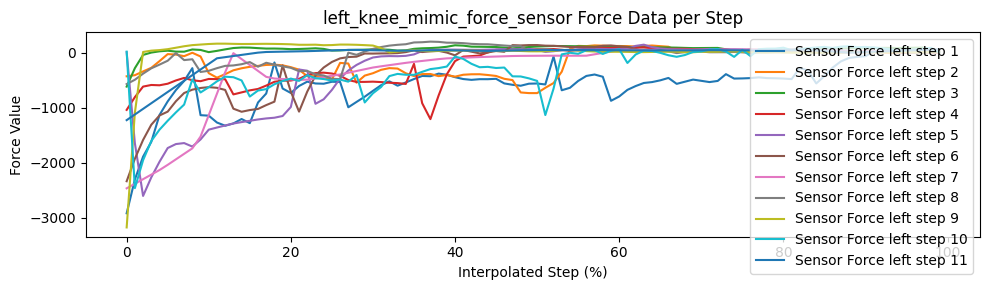

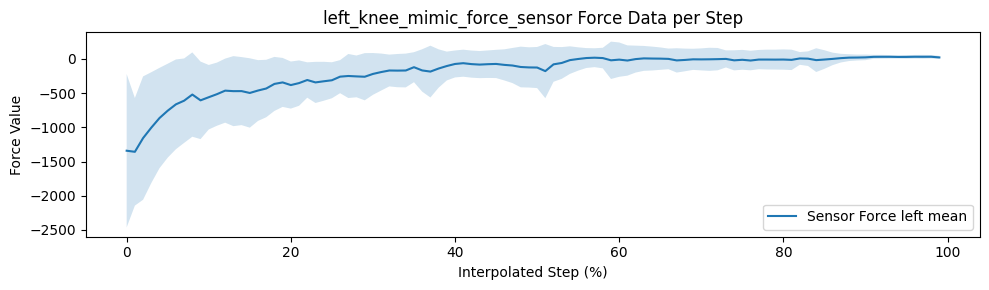

Processing sensor: right_knee_mimic_force_sensor


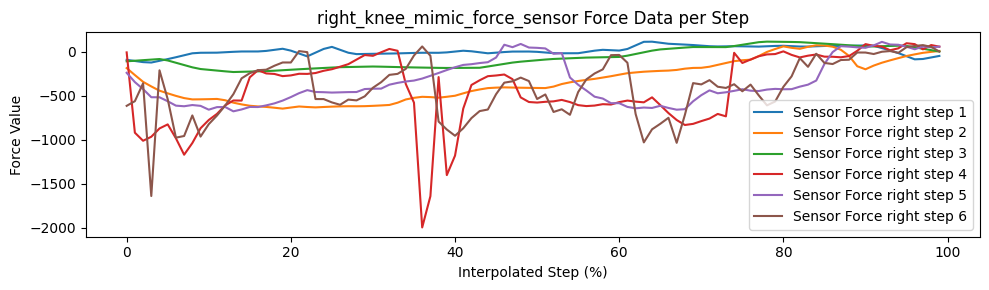

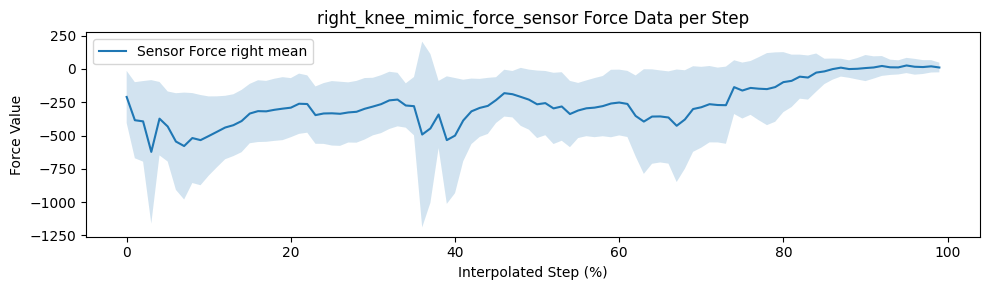

Processing sensor: left_foot_mimic_force_sensor


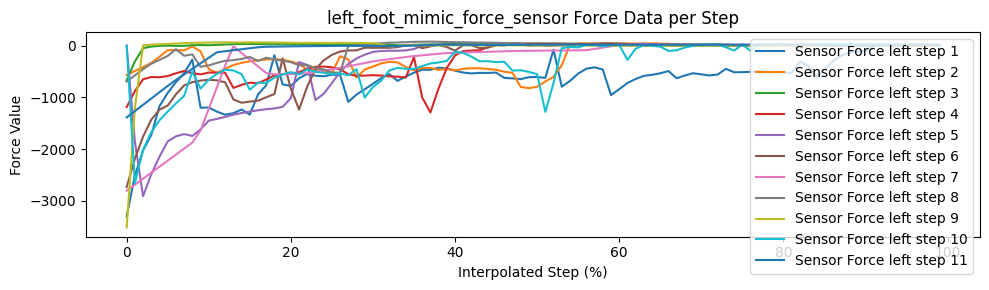

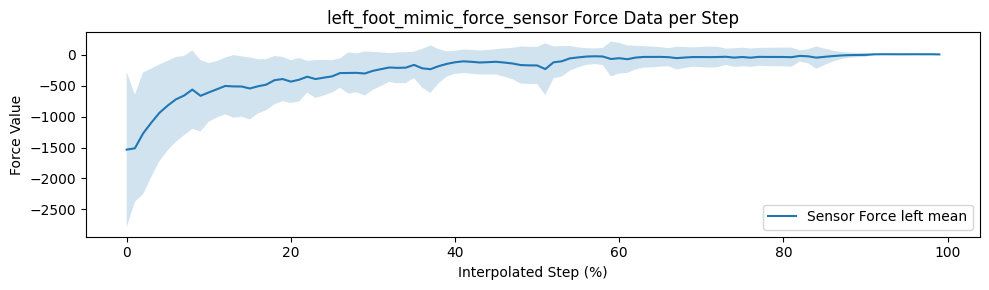

Processing sensor: right_foot_mimic_force_sensor


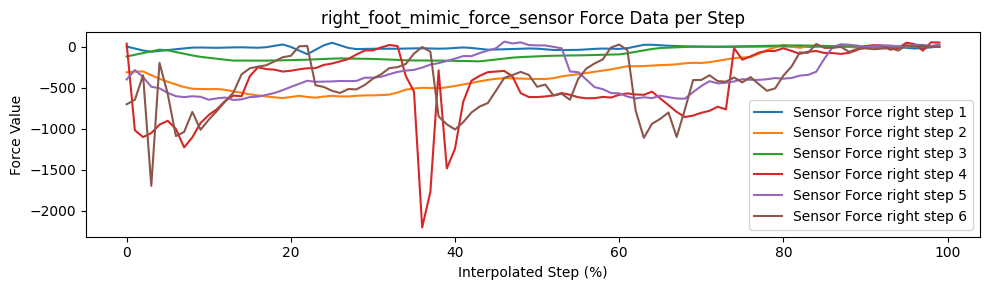

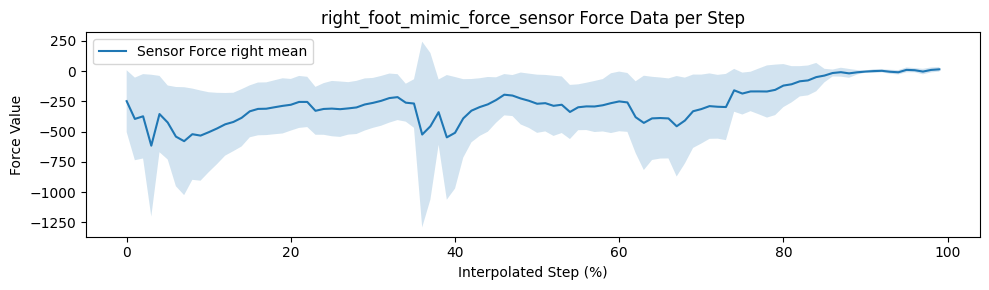

In [163]:
# Plot all sensor force data per step 
if all_sensor_force_data:
    print("Plotting all sensor force data per step...")
    for sensor_name in sensor_force_names:
        print(f"Processing sensor: {sensor_name}")
        force_data = all_sensor_force_data[sensor_name]

        # Check the shape of the first element to determine available columns
        first_elem = np.array(force_data[0])

        if "left_" in sensor_name:
            step_indices_left = all_step_start_left
            step_indices_right = []
        elif "right_" in sensor_name:
            step_indices_left = []
            step_indices_right = all_step_start_right

        # Plot the sensor force data per step
        postprocess_handler.plot_parameter_per_step(
            force_data,
            step_indices_left,
            step_indices_right,
            param_name="Sensor Force Data",
            interp_mode="interp",
            interp_len=100,  # Interpolate to 100 points per step
            columns=[1], # for y [1]
            ylabel="Force Value",
            title=f"{sensor_name} Force Data per Step",
            legend_prefix="Sensor Force ",
        )

        # Plot the mean sensor force data per step
        postprocess_handler.plot_parameter_mean_per_step(
            force_data,
            step_indices_left,
            step_indices_right,
            param_name="Sensor Force Data",
            interp_mode="interp",
            interp_len=100,  # Interpolate to 100 points per step
            columns=[1], # for y [1]
            ylabel="Force Value",
            title=f"{sensor_name} Force Data per Step",
            legend_prefix="Sensor Force ",
        )

GRF data 

Plotting GRF L data per step...


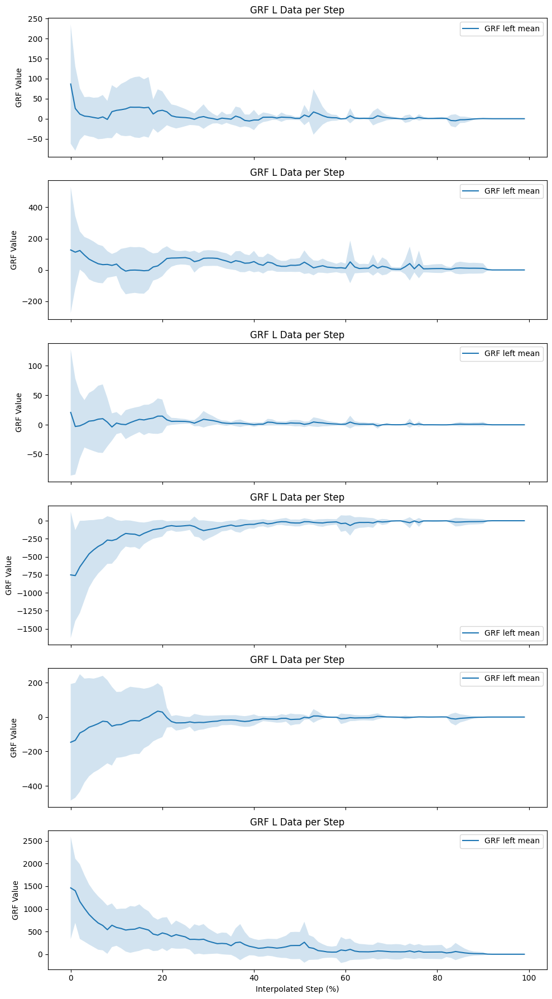

Plotting GRF R data per step...


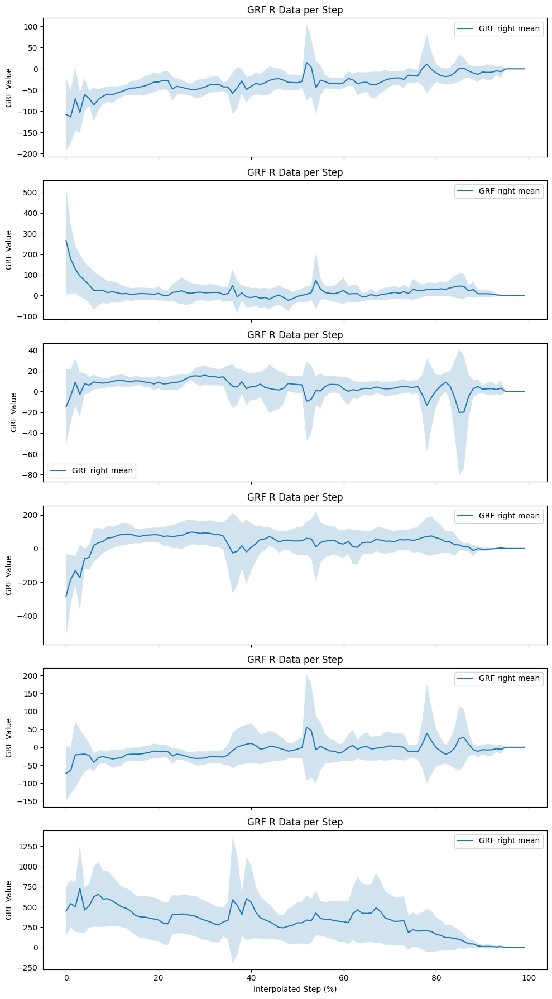

In [ ]:
# GRF data per step
# !!! COULD BE COLUMN 5 (z) for correct GRF data as in Cartesian Space of World????
if all_grf_l:
    print("Plotting GRF L data per step...")
    # Plot GRF L data per step
    # postprocess_handler.plot_parameter_per_step(
    #     all_grf_l,
    #     all_step_start_left,
    #     [],
    #     param_name="Ground Reaction Force (GRF)",
    #     interp_mode="interp",
    #     interp_len=100,  # Interpolate to 100 points per step
    #     columns=[0,1,2,3,4,5],  # Assuming GRF data has at least 3 columns (Fx, Fy, Fz)
    #     ylabel="GRF Value",
    #     title="GRF L Data per Step",
    #     legend_prefix="GRF ",
    # )

    # Plot mean GRF L data per step
    postprocess_handler.plot_parameter_mean_per_step(
        all_grf_l,
        all_step_start_left,
        [],
        param_name="Ground Reaction Force (GRF)",
        interp_mode="interp",
        interp_len=100,  # Interpolate to 100 points per step
        columns=[0,1,2,3,4,5],  # Assuming GRF data has at least 3 columns (Fx, Fy, Fz)
        ylabel="GRF Value",
        title="GRF L Data per Step",
        legend_prefix="GRF ",
    )

if all_grf_r:
    print("Plotting GRF R data per step...")

    # Plot GRF R data per step 
    # postprocess_handler.plot_parameter_per_step(
    #     all_grf_r,
    #     [],
    #     all_step_start_right,
    #     param_name="Ground Reaction Force (GRF)",
    #     interp_mode="interp",
    #     interp_len=100,  # Interpolate to 100 points per step
    #     columns=[0,1,2,3,4,5],  # Assuming GRF data has at least 3 columns (Fx, Fy, Fz)
    #     ylabel="GRF Value",
    #     title="GRF R Data per Step",
    #     legend_prefix="GRF ",
    # )

    # Plot mean GRF R data per step
    postprocess_handler.plot_parameter_mean_per_step(
        all_grf_r,
        [],
        all_step_start_right,
        param_name="Ground Reaction Force (GRF)",
        interp_mode="interp",
        interp_len=100,  # Interpolate to 100 points per step
        columns=[0,1,2,3,4,5],  # Assuming GRF data has at least 3 columns (Fx, Fy, Fz)
        ylabel="GRF Value",
        title="GRF R Data per Step",
        legend_prefix="GRF ",
    )



Joint kinematics and kinetics 

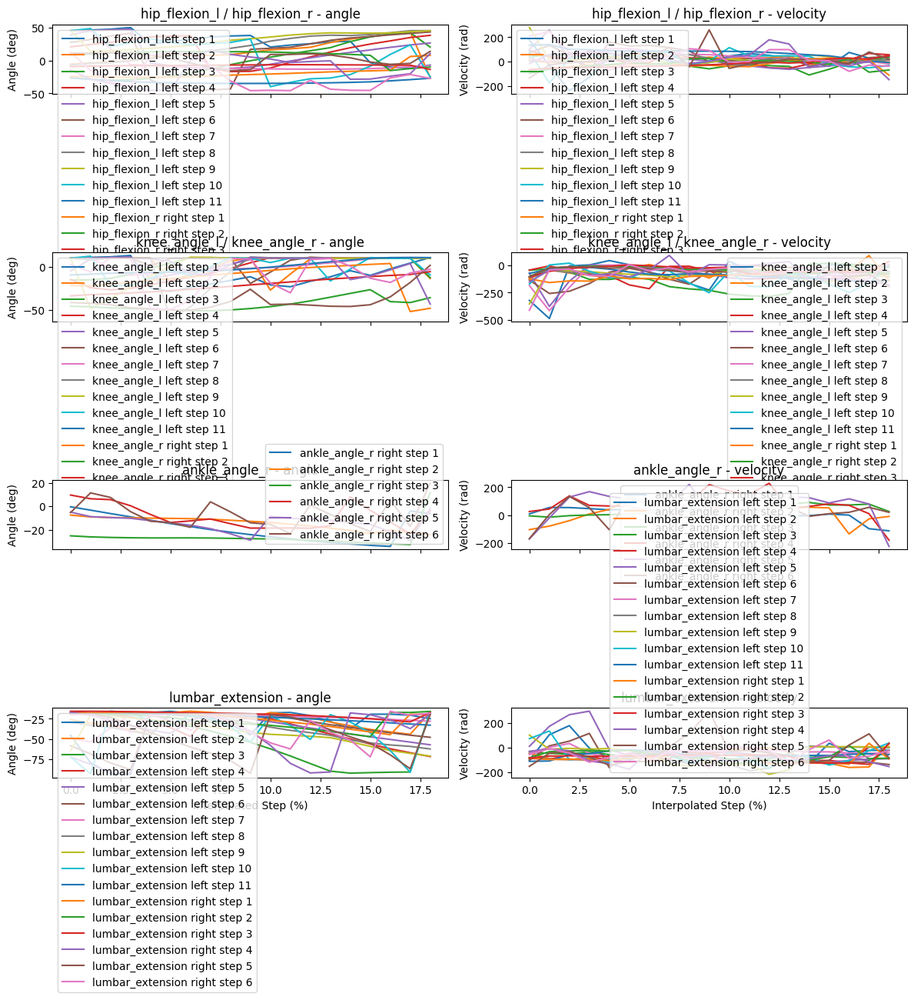

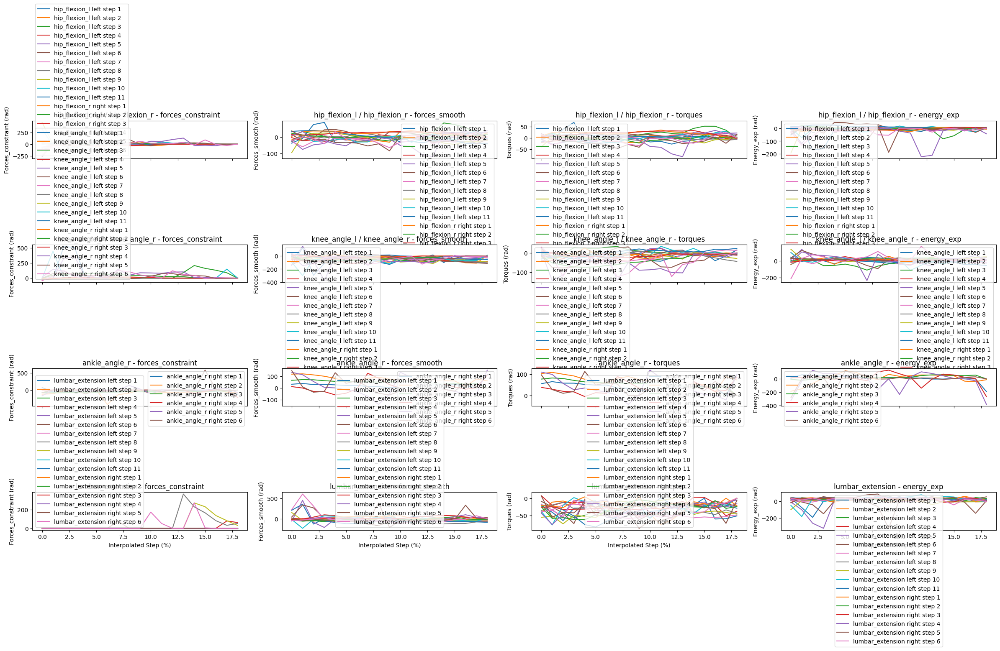

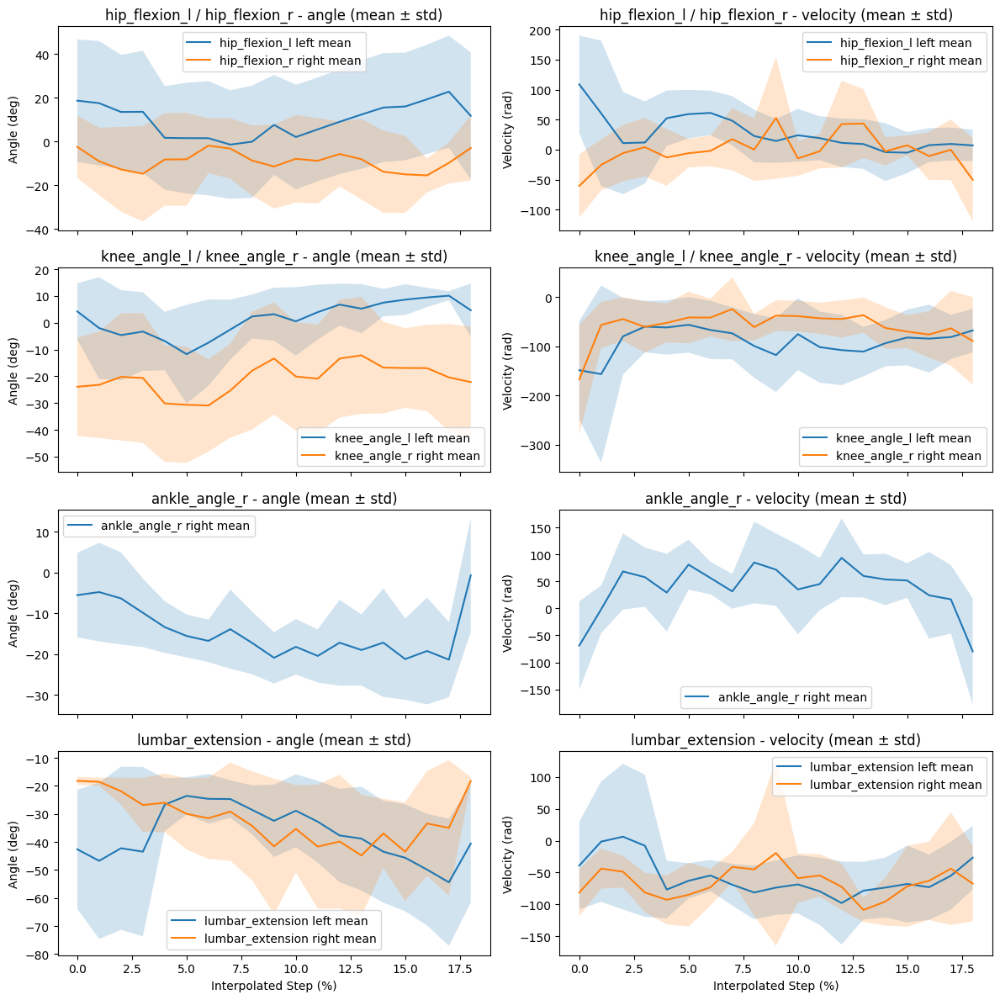

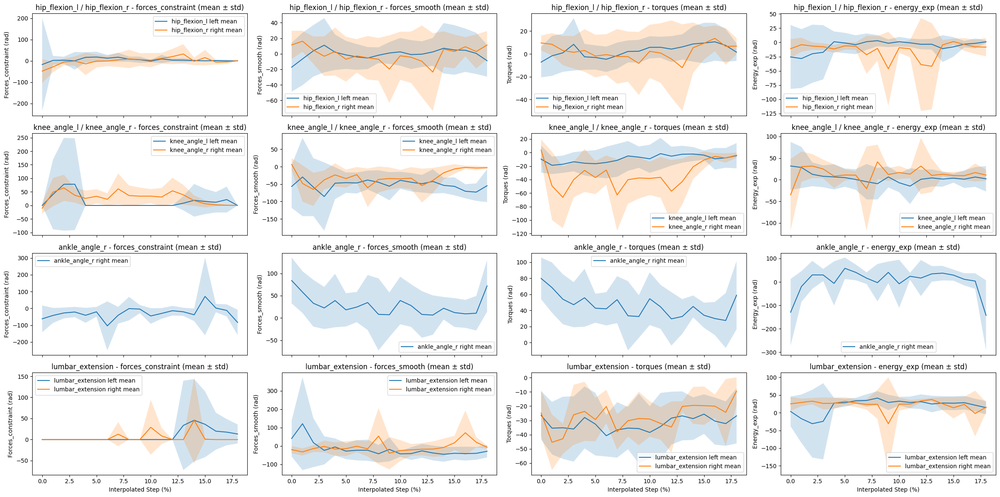

In [165]:
# Plot joint parameters per step
postprocess_handler.plot_joint_parameter_per_step(joint_pairs, joint_data, all_step_start_left, all_step_start_right, ["angle", "velocity"], convert_to_deg = True)
postprocess_handler.plot_joint_parameter_per_step(joint_pairs, joint_data, all_step_start_left, all_step_start_right, parameter_names=["forces_constraint", "forces_smooth", "torques", "energy_exp"])

# Plot mean joint parameters per step 
postprocess_handler.plot_joint_parameter_mean_per_step(joint_pairs, joint_data, all_step_start_left, all_step_start_right, parameter_names=["angle", "velocity"], convert_to_deg = True)
postprocess_handler.plot_joint_parameter_mean_per_step(joint_pairs, joint_data, all_step_start_left, all_step_start_right, parameter_names=["forces_constraint", "forces_smooth", "torques", "energy_exp"])

# Muscle activation analysis 

Muscle activation per step 

all_chosen_actuator {'glut_min3_l': [], 'vas_med_r': []}
Found muscle name 'glut_min3_l' in all_muscles with index 62
Found muscle name 'vas_med_r' in all_muscles with index 42
all_chosen_actuator: {'glut_min3_l': [Array(0.5277217, dtype=float32), Array(0.09088742, dtype=float32), Array(0.14799066, dtype=float32), Array(0.07748414, dtype=float32), Array(0.08306247, dtype=float32), Array(0.40683594, dtype=float32), Array(0.09918919, dtype=float32), Array(0.42418474, dtype=float32), Array(0.53742933, dtype=float32), Array(0.5133884, dtype=float32), Array(0.14829712, dtype=float32), Array(0.08407138, dtype=float32), Array(0.3839523, dtype=float32), Array(0.16168422, dtype=float32), Array(0.4149136, dtype=float32), Array(0.21294956, dtype=float32), Array(0.24369308, dtype=float32), Array(0.24538969, dtype=float32), Array(0.2349614, dtype=float32), Array(0.31252035, dtype=float32), Array(0.45880103, dtype=float32), Array(0.27790245, dtype=float32), Array(0.5512113, dtype=float32), Array(0.3

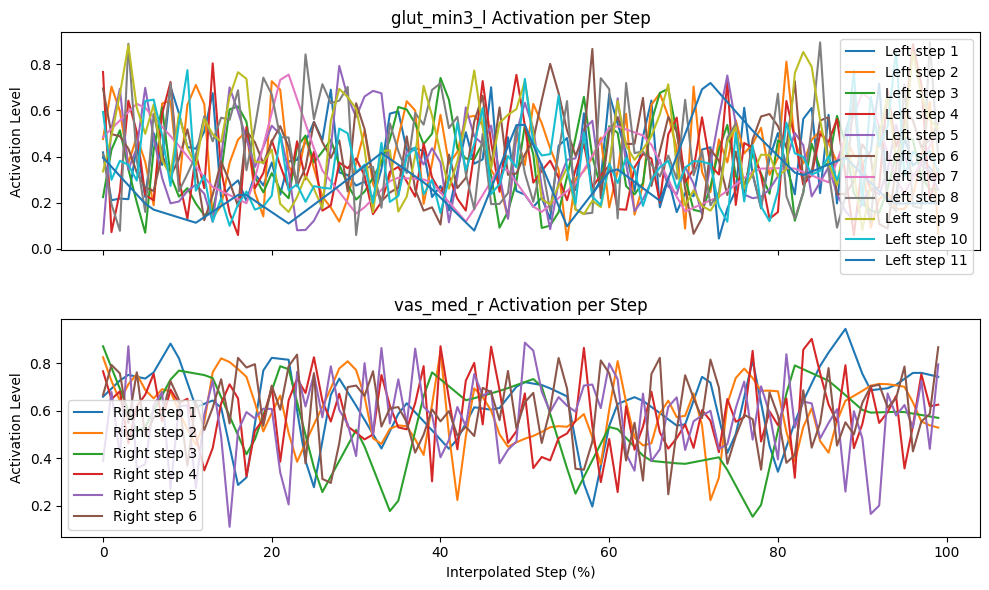

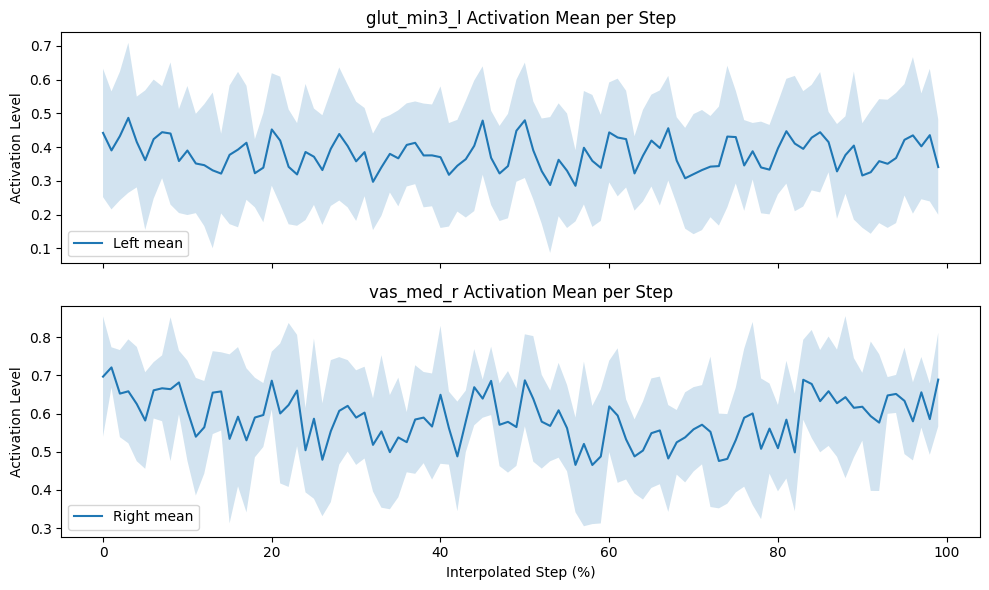

In [166]:
# Muscle activations per step
muscle_names_list = ['glut_min3_l', 'vas_med_r']  # List of muscle names to plot
all_sides = []
all_chosen_actuator = {muscle_name: [] for muscle_name in muscle_names_list}
print("all_chosen_actuator", all_chosen_actuator)
for muscle_name in muscle_names_list:
    for a, actuator_name in enumerate(all_actuator_names):
        if muscle_name == actuator_name:
            print(f"Found muscle name '{muscle_name}' in all_muscles with index {a}")
            for i in range(len(all_actions)):
                all_chosen_actuator[muscle_name].append(all_actions[i][0][a])

print('all_chosen_actuator:', all_chosen_actuator)

# Muscle activation per step
postprocess_handler.plot_muscle_activations_per_step(
    all_chosen_actuator,
    muscle_names_list,
    all_step_start_left,
    all_step_start_right,
    interp_len=100
)



# Mean muscle activation per step
postprocess_handler.plot_muscle_activations_mean_per_step(
    all_chosen_actuator,
    muscle_names_list,
    all_step_start_left,
    all_step_start_right,
    interp_len=100
)

Muscle activation analysis sum of full run 

idx: 0 processed_data: 20232.25
idx: 1 processed_data: 20.232250213623047
idx: 2 processed_data: 0.9410643577575684


/tmp/ipykernel_1595111/2818827503.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[idx].set_xticklabels(muscle_groups, rotation=45, ha='right')
/tmp/ipykernel_1595111/2818827503.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[idx].set_xticklabels(muscle_groups, rotation=45, ha='right')
/tmp/ipykernel_1595111/2818827503.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[idx].set_xticklabels(muscle_groups, rotation=45, ha='right')


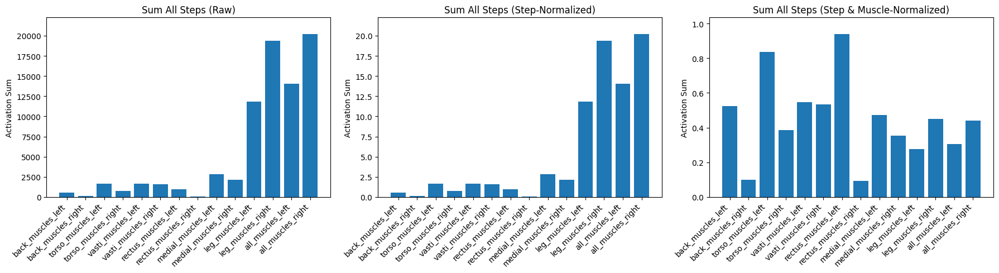

In [167]:
#### Test ####
# Bar plot sum along all steps and muscles data for all muscles and all parameters 

relevant_parameters =  ["sum_all_steps_all_muscles", "sum_all_steps_all_muscles_stepNorm", "sum_all_steps_all_muscles_muscNumStepNorm"]

n_params = len(relevant_parameters)

fig, axes = plt.subplots(1, n_params, figsize=(6 * n_params, 5)) #, sharey=True)

# Get the muscle groups from one of the activation dicts (they all have the same keys)
muscle_groups = list(sum_all_steps_all_muscles_act.keys())

if n_params == 1:
    axes = [axes]

for idx, param in enumerate(relevant_parameters):
    if param == "sum_all_steps_all_muscles":
        data = [sum_all_steps_all_muscles_act[mg] for mg in muscle_groups]
        title = "Sum All Steps (Raw)"
    elif param == "sum_all_steps_all_muscles_stepNorm":
        data = [sum_all_steps_all_muscles_stepNorm_act[mg] for mg in muscle_groups]
        title = "Sum All Steps (Step-Normalized)"
    elif param == "sum_all_steps_all_muscles_muscNumStepNorm":
        data = [sum_all_steps_all_muscles_muscNumStepNorm_act[mg] for mg in muscle_groups]
        title = "Sum All Steps (Step & Muscle-Normalized)"


    # Convert data to scalars for plotting (handle arrays and tuples)
    processed_data = []
    for d in data:
        # If it's a tuple (e.g., (Array(...),)), take the first element
        if isinstance(d, tuple):
            d = d[0]
        # If it's a numpy/jax array, take the scalar value
        if hasattr(d, "item"):
            d = d.item()
        processed_data.append(d)

    axes[idx].bar(muscle_groups, processed_data)
    # Set y-limit for each subplot individually
    print('idx:', idx, 'processed_data:', max(processed_data))
    axes[idx].set_ylim(0, max(processed_data) * 1.1)  # Set y-limit to 10% above max value for this subplot
    axes[idx].set_title(title)
    axes[idx].set_xticklabels(muscle_groups, rotation=45, ha='right')
    axes[idx].set_ylabel("Activation Sum")
  
    
plt.tight_layout()
plt.show()


# Symmetry 

Muscle activation

back_muscles: left=0.5244734287261963, right=0.09795365482568741, diff=-0.4265197739005089
torso_muscles: left=0.8363195657730103, right=0.3843463063240051, diff=-0.4519732594490051
vasti_muscles: left=0.5470166206359863, right=0.5345733761787415, diff=-0.012443244457244873
rectus_muscles: left=0.9410643577575684, right=0.09288601577281952, diff=-0.8481783419847488
medial_muscles: left=0.472042053937912, right=0.3547413647174835, diff=-0.11730068922042847
leg_muscles: left=0.27548664808273315, right=0.4503628611564636, diff=0.17487621307373047
all_muscles: left=0.30528345704078674, right=0.43983152508735657, diff=0.13454806804656982


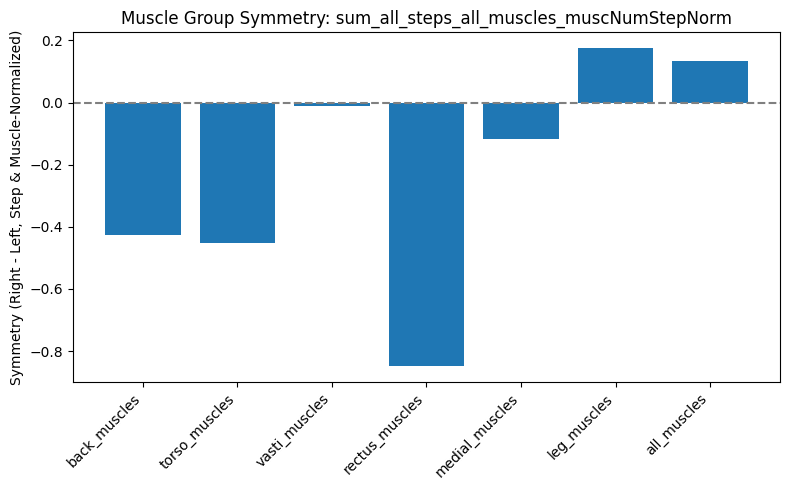

In [168]:
# Muscle activation over complete run 
# Calculate symmetry (right - left) for each muscle group (ignoring 'all_muscles')
symmetry_groups = [g.replace('_left', '') for g in muscle_groups if g.endswith('_left') and g.replace('_left', '_right') in muscle_groups]
symmetry_values = []
for base in symmetry_groups:
    left = sum_all_steps_all_muscles_muscNumStepNorm_act.get(f"{base}_left")
    right = sum_all_steps_all_muscles_muscNumStepNorm_act.get(f"{base}_right")
    # Convert to scalar
    if isinstance(left, tuple):
        left = left[0]
    if hasattr(left, "item"):
        left = left.item()
    if isinstance(right, tuple):
        right = right[0]
    if hasattr(right, "item"):
        right = right.item()
    print(f"{base}: left={left}, right={right}, diff={right-left}")
    symmetry_values.append(right - left)

plt.figure(figsize=(8, 5))
plt.bar(symmetry_groups, symmetry_values)
plt.axhline(0, color='gray', linestyle='--')
plt.ylabel("Symmetry (Right - Left, Step & Muscle-Normalized)")
plt.title("Muscle Group Symmetry: sum_all_steps_all_muscles_muscNumStepNorm")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

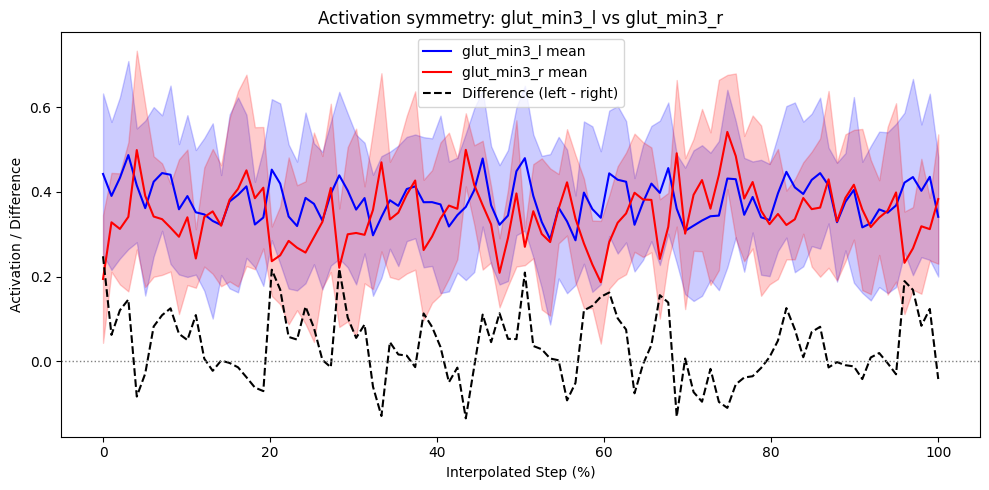

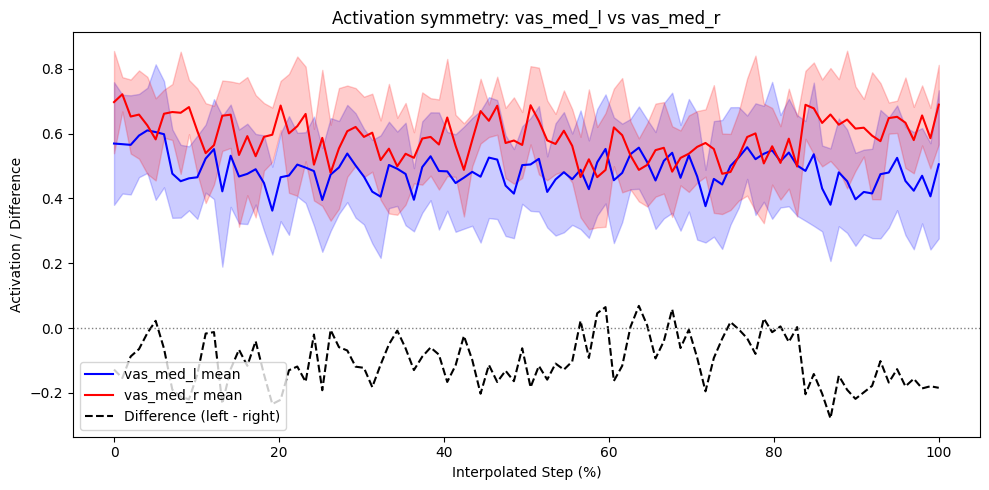

In [184]:
# Muscle activation for each step 
muscle_names_list = ['glut_min3', 'vas_med']  # List of muscle names to plot

postprocess_handler.plot_muscle_activation_symmetry(
        muscle_names_list,
        all_actuator_names,
        all_actions,
        all_step_start_left,
        all_step_start_right,
        interp_len=100
)



Joint angles

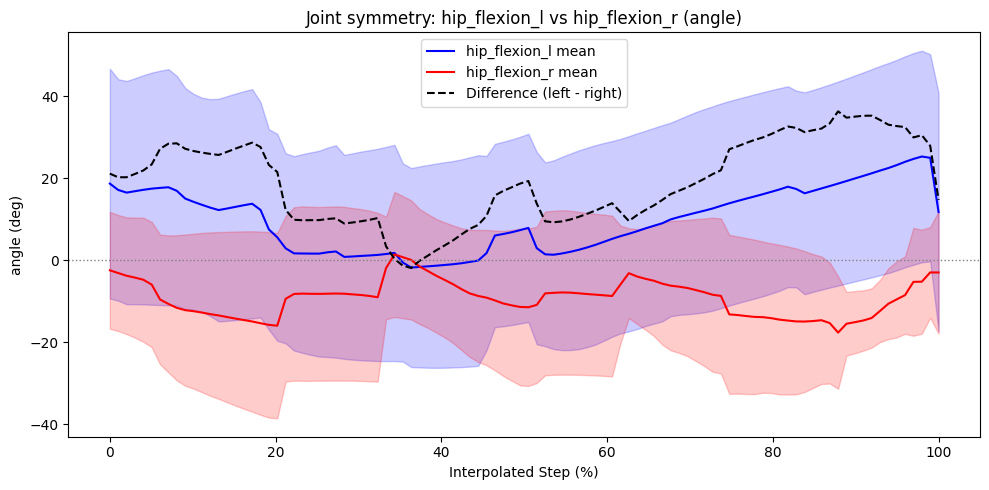

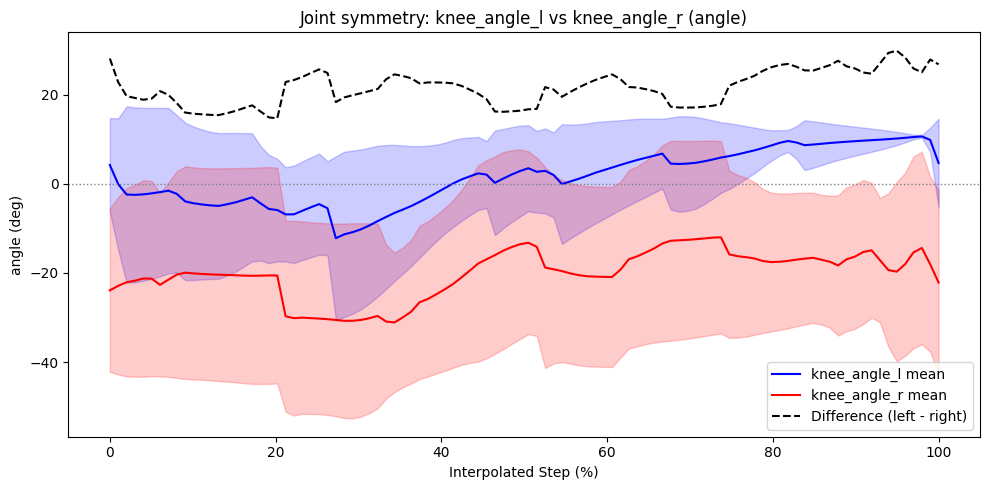

Missing data for ankle_angle_l or ankle_angle_r
Missing data for subtalar_angle_l or subtalar_angle_r
Missing data for mtp_angle_l or mtp_angle_r


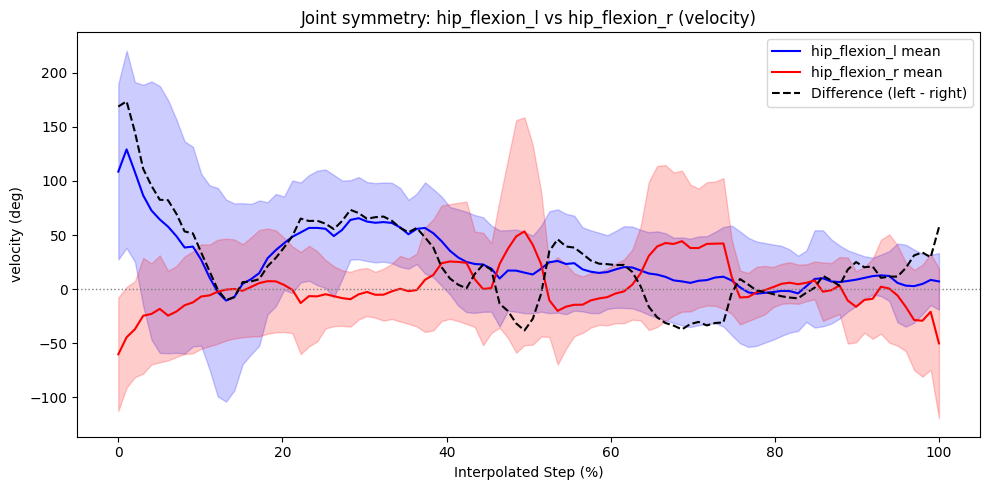

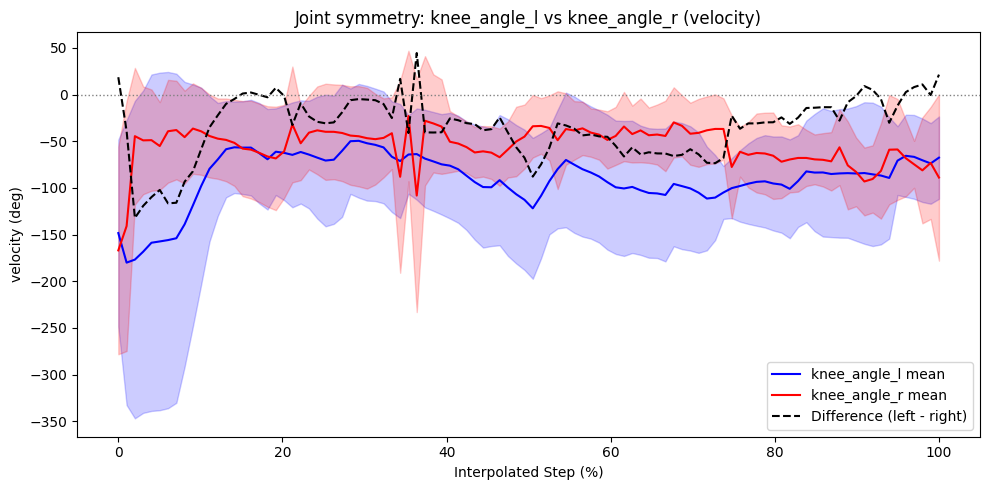

Missing data for ankle_angle_l or ankle_angle_r
Missing data for subtalar_angle_l or subtalar_angle_r
Missing data for mtp_angle_l or mtp_angle_r


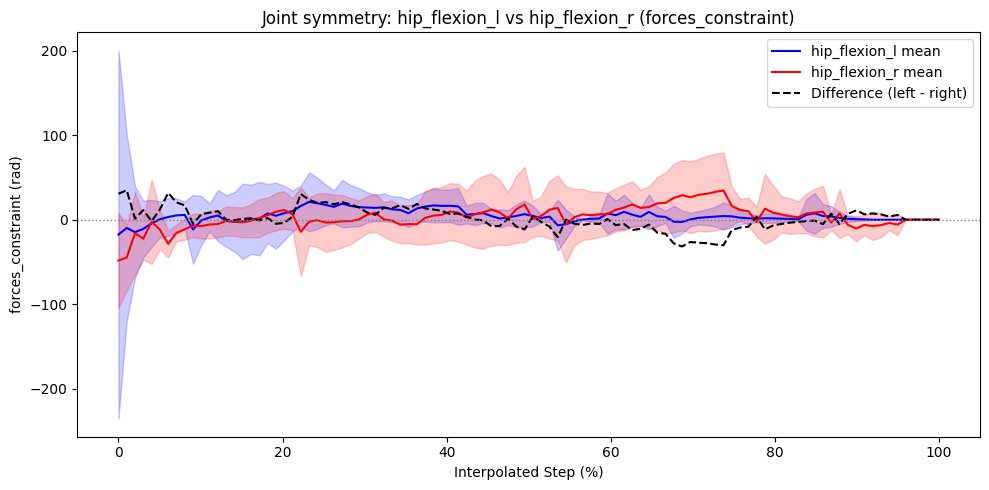

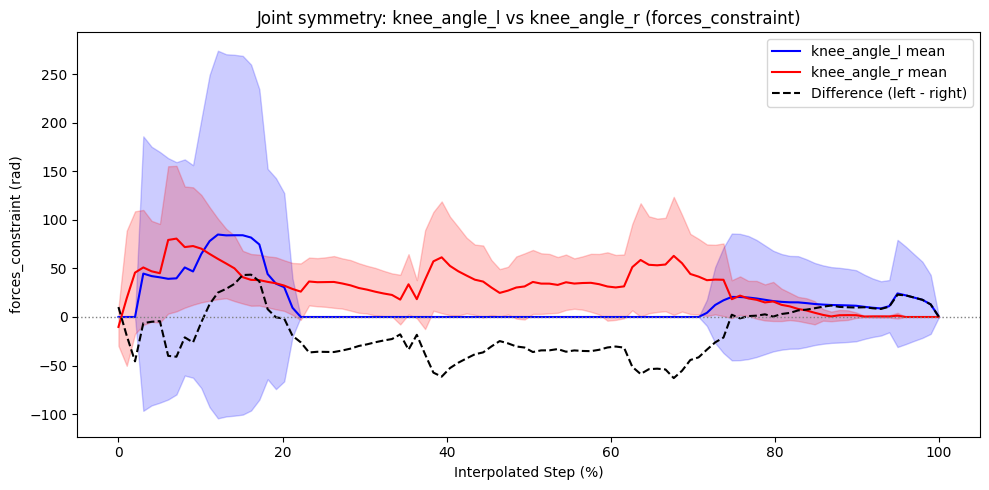

Missing data for ankle_angle_l or ankle_angle_r
Missing data for subtalar_angle_l or subtalar_angle_r
Missing data for mtp_angle_l or mtp_angle_r


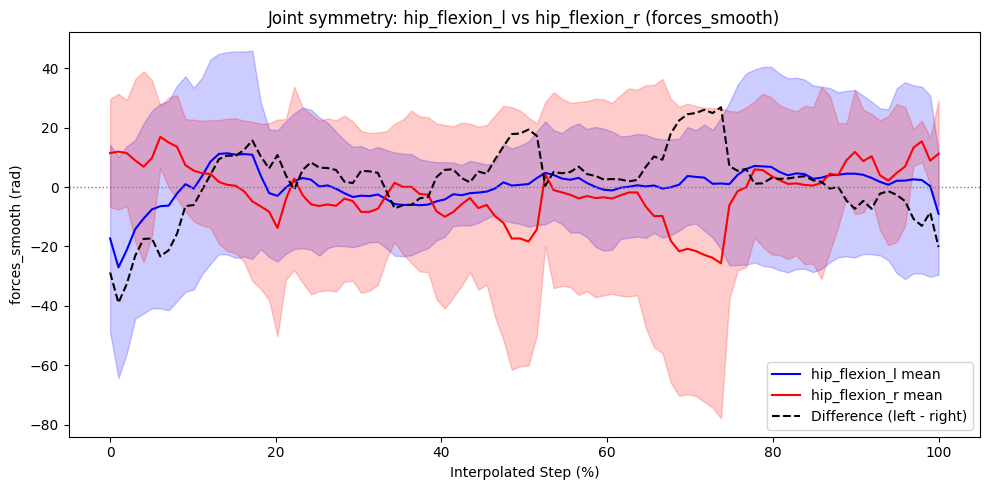

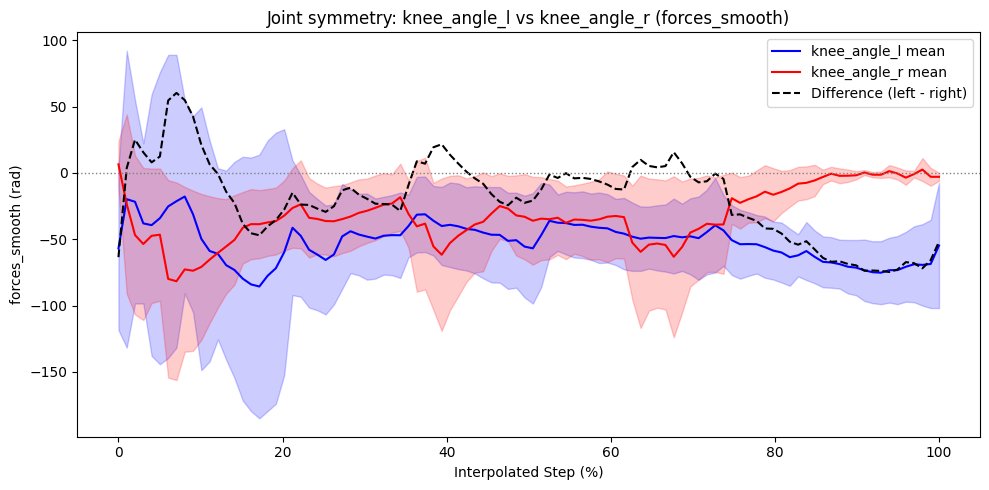

Missing data for ankle_angle_l or ankle_angle_r
Missing data for subtalar_angle_l or subtalar_angle_r
Missing data for mtp_angle_l or mtp_angle_r


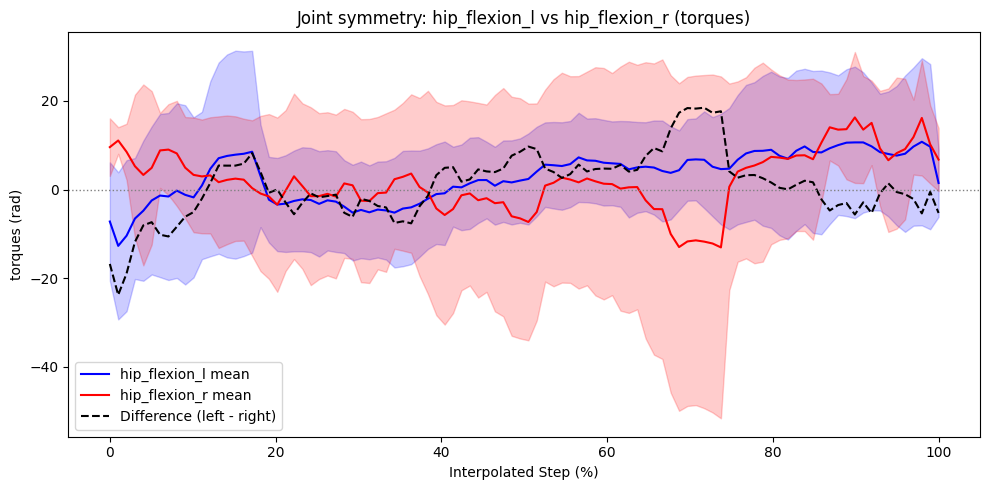

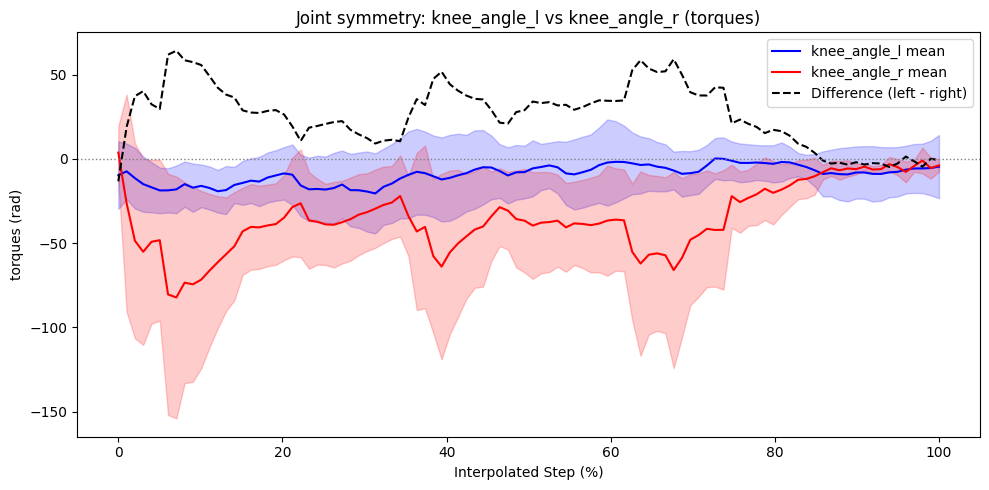

Missing data for ankle_angle_l or ankle_angle_r
Missing data for subtalar_angle_l or subtalar_angle_r
Missing data for mtp_angle_l or mtp_angle_r


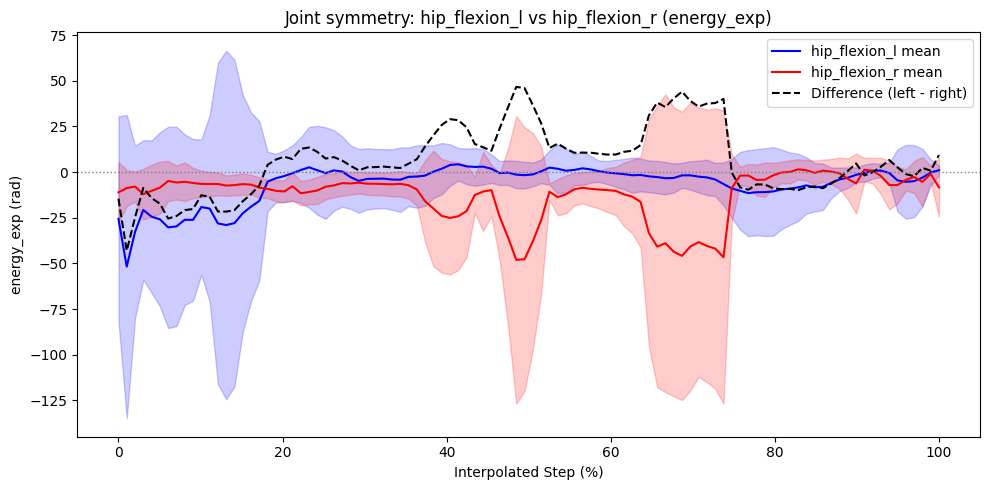

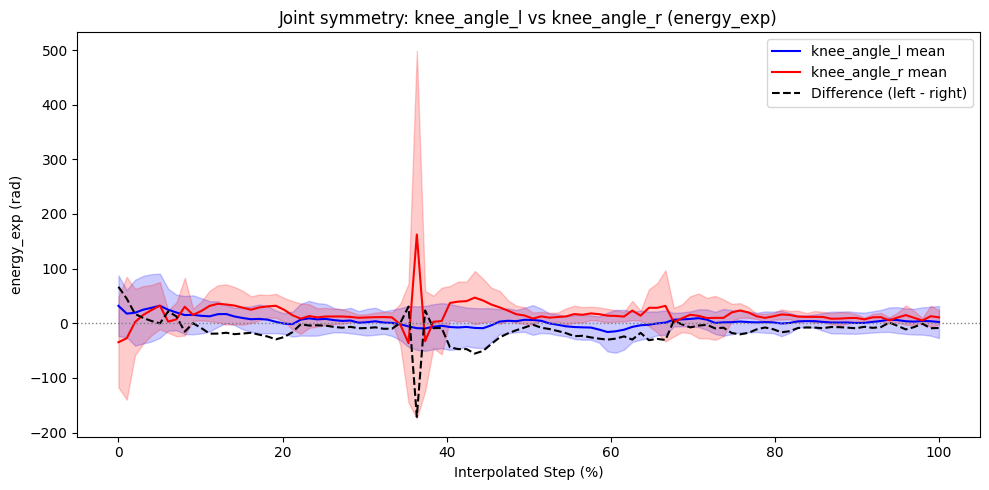

Missing data for ankle_angle_l or ankle_angle_r
Missing data for subtalar_angle_l or subtalar_angle_r
Missing data for mtp_angle_l or mtp_angle_r


In [194]:
# Calculate and plot symmetry for joint angles (mean left - mean right per time step)
joint_names_list = ['hip_flexion', 'knee_angle', 'ankle_angle', 'subtalar_angle', 'mtp_angle']  # List of joint base names

postprocess_handler.plot_joint_angle_symmetry(
            joint_names_list,
            joint_data,
            all_step_start_left,
            all_step_start_right,
            parameter_name = "angle",
            convert_to_deg=True,
            interp_len=100,
        )

postprocess_handler.plot_joint_angle_symmetry(
            joint_names_list,
            joint_data,
            all_step_start_left,
            all_step_start_right,
            parameter_name = "velocity",
            convert_to_deg=True,
            interp_len=100,
        )


postprocess_handler.plot_joint_angle_symmetry(
            joint_names_list,
            joint_data,
            all_step_start_left,
            all_step_start_right,
            parameter_name = "forces_constraint",
            convert_to_deg=False,
            interp_len=100,
        )

postprocess_handler.plot_joint_angle_symmetry(
            joint_names_list,
            joint_data,
            all_step_start_left,
            all_step_start_right,
            parameter_name = "forces_smooth",
            convert_to_deg=False,
            interp_len=100,
        )

postprocess_handler.plot_joint_angle_symmetry(
            joint_names_list,
            joint_data,
            all_step_start_left,
            all_step_start_right,
            parameter_name = "torques",
            convert_to_deg=False,
            interp_len=100,
        )


postprocess_handler.plot_joint_angle_symmetry(
            joint_names_list,
            joint_data,
            all_step_start_left,
            all_step_start_right,
            parameter_name = "energy_exp",
            convert_to_deg=False,
            interp_len=100,
        )

GRF

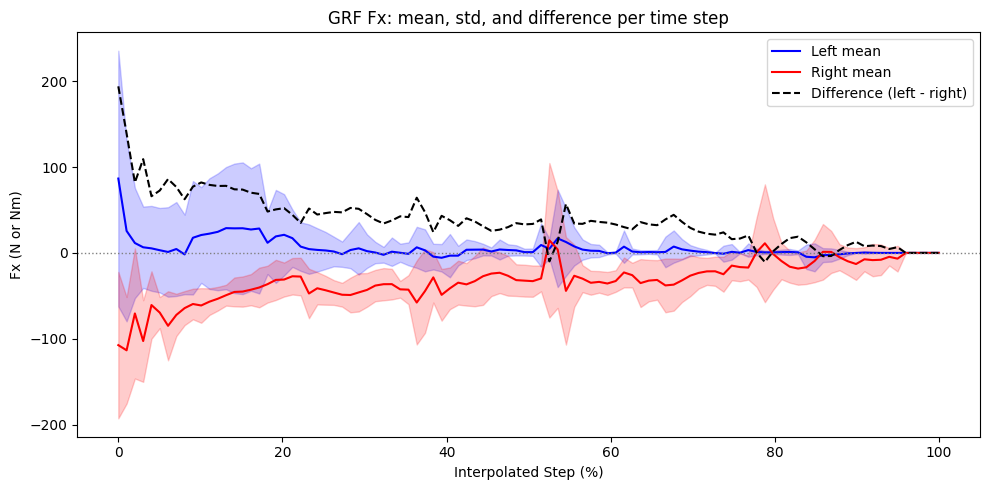

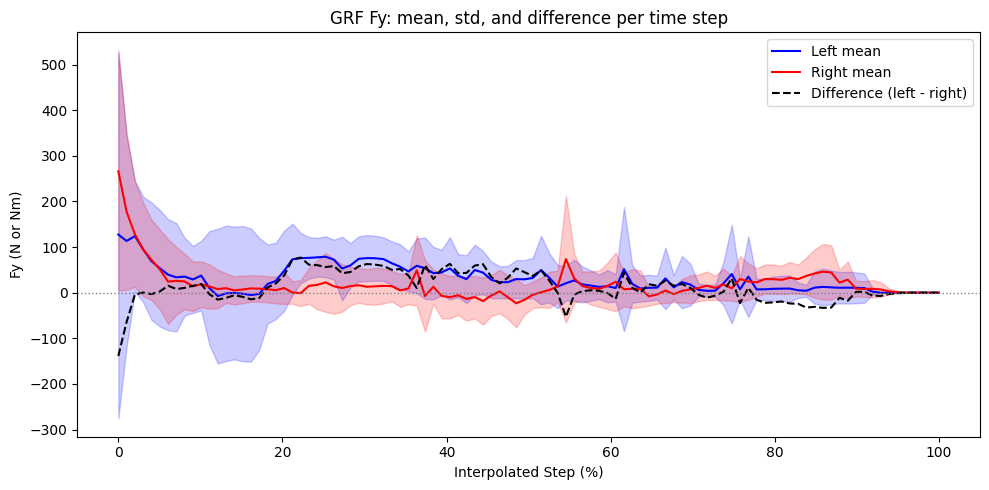

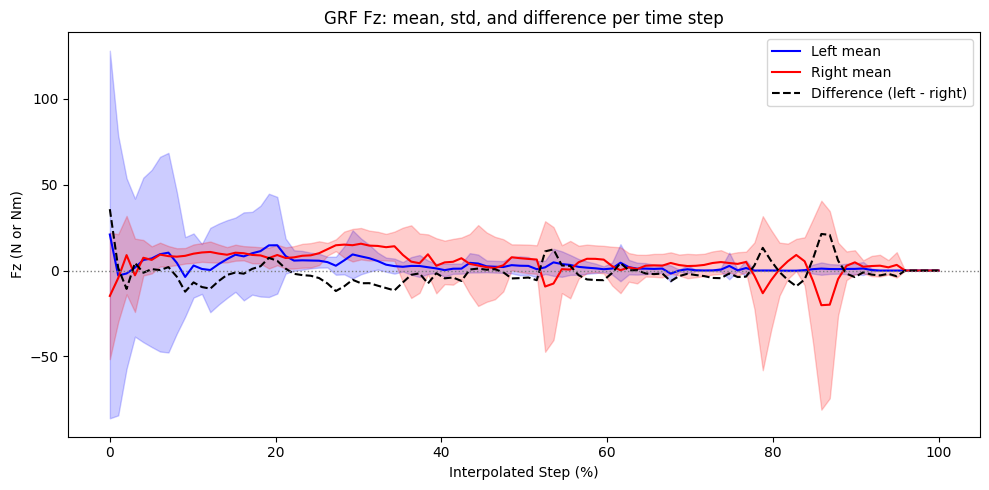

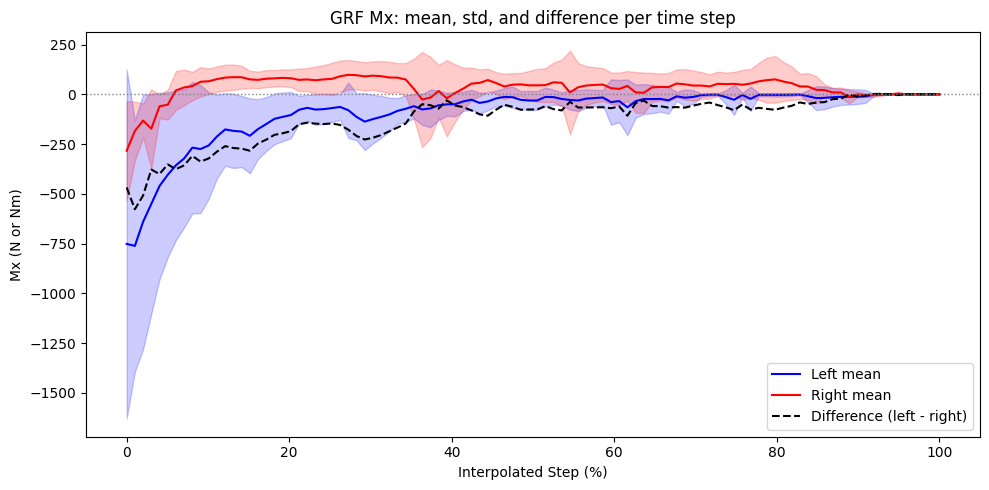

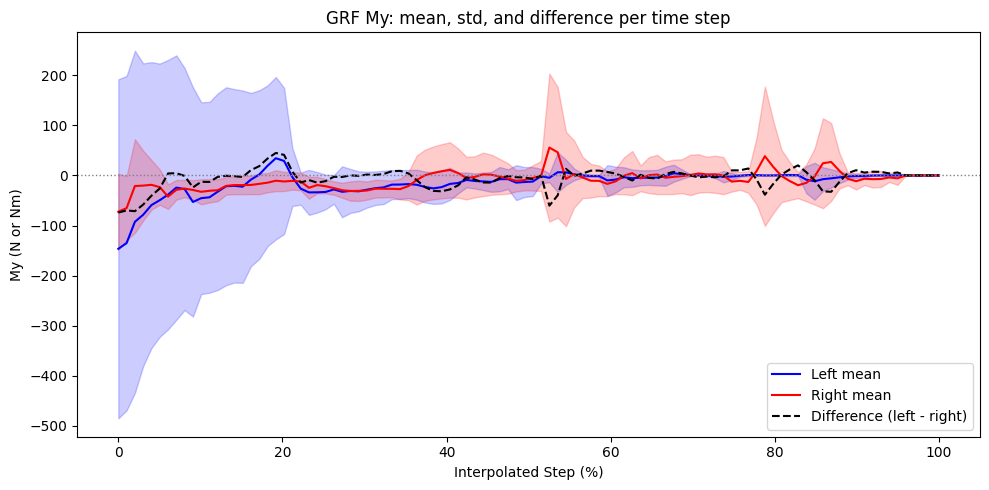

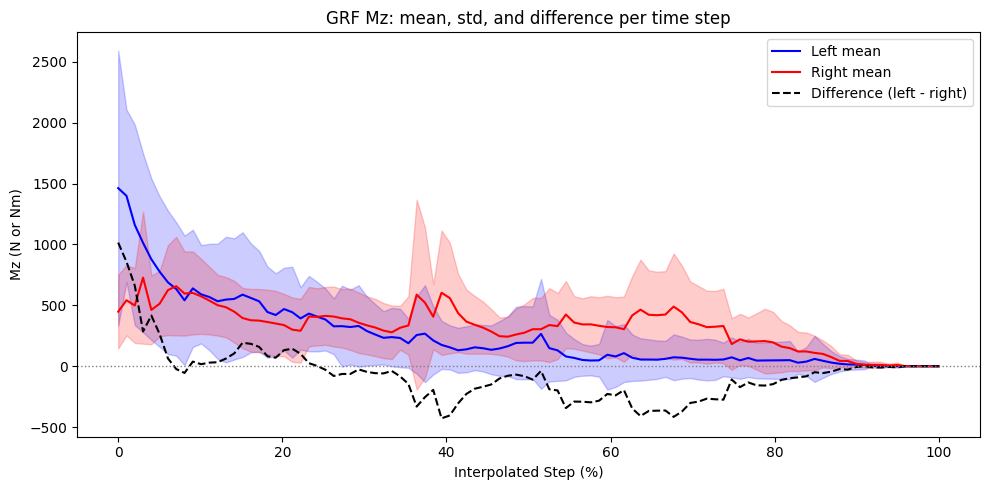

In [ ]:
# Calculate and plot symmetry for GRF (mean left - mean right per time step) for each GRF component
grf_components = ['Fx', 'Fy', 'Fz', 'Mx', 'My', 'Mz']  # Assuming 6 columns in GRF data


postprocess_handler.plot_grf_component_symmetry(
        grf_components,
        all_grf_l,
        all_grf_r,
        all_step_start_left,
        all_step_start_right,
        interp_len=100,
    )


Force sensor

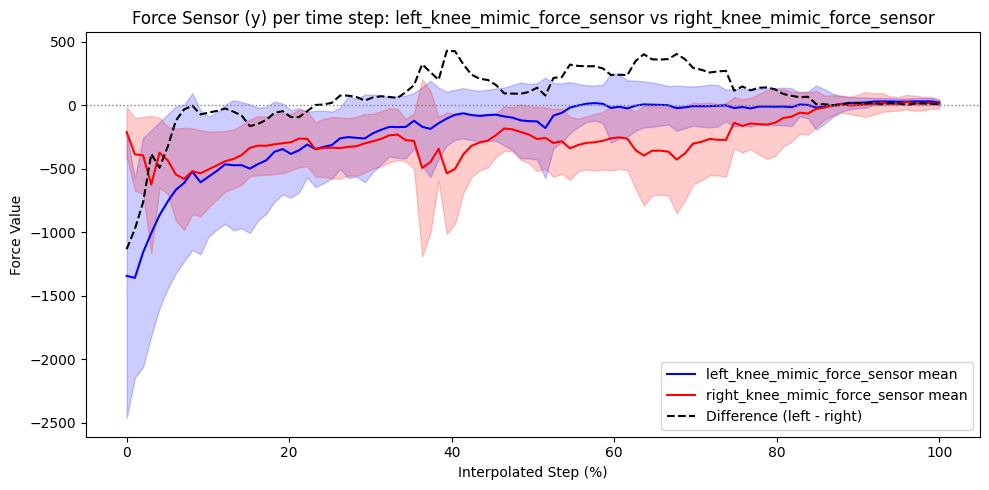

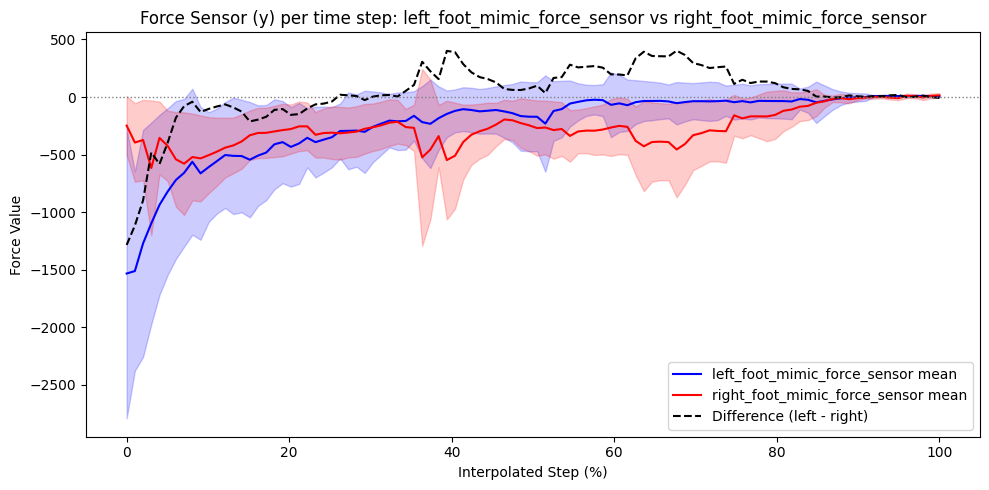

In [171]:
# # Calculate and plot symmetry for force sensor data (mean left - mean right per time step) for each force sensor pair
# # Also plot mean and std for left and right


postprocess_handler.plot_sensor_force_symmetry(
        sensor_force_names,
        all_sensor_force_data,
        all_step_start_left,
        all_step_start_right,
        interp_len=100,
    )


# Compare different Runs 


First load all data from different files

In [6]:
# Define a mapping from variable names to output paths
run_names = {
    "run1": "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250614_015126_evaluation_results_1000steps.pkl",
    "run2": "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250614_015126_evaluation_results_1000steps.pkl",
    # Add more as needed
}

# Dictionary to hold loaded data
all_loaded_data = {}

for var_name, path in run_names.items():
    with open(path, "rb") as f:
        loaded_data = pickle.load(f)
        print(f"Loaded data for {var_name} from {path}: {loaded_data.keys()}")
        all_loaded_data[var_name] = loaded_data





Loaded data for run1 from /home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250614_015126_evaluation_results_1000steps.pkl: dict_keys(['total_steps', 'n_envs', 'all_grf_l', 'all_grf_r', 'all_foot_ground_contact_left', 'all_foot_ground_contact_right', 'all_sensor_force', 'sensor_force_names', 'sum_step_activations', 'step_norm_activations', 'sum_muscles_activations', 'step_muscles_norm_activations', 'step_num_norm_activations', 'evaluation_muscle_groups', 'evaluation_joint_names', 'evaluation_muscle_names', 'all_actions', 'all_actuator_names', 'root_angle', 'root_velocity', 'root_forces_constraint', 'root_forces_smooth', 'root_torques', 'root_energy_exp', 'root_angle_per_step_left', 'root_angle_per_step_right', 'root_velocity_per_step_left', 'root_velocity_per_step_right', 'root_forces_constraint_per_step_left', 'root_forces_constraint_per_step_right', 'root_forces_smooth_per_step_left', 'root_forces_smooth_per_step_right', 'root_torques_per_step_left', 'root_t

In [7]:
# Extract and process step data for each run
run_step_data = {}

for run_key, run_dict in all_loaded_data.items():
    all_foot_ground_contact_left = run_dict.get("all_foot_ground_contact_left", [])
    all_foot_ground_contact_right = run_dict.get("all_foot_ground_contact_right", [])

    filtered_left = [contact for contact in all_foot_ground_contact_left if contact != []]
    filtered_right = [contact for contact in all_foot_ground_contact_right if contact != []]

    if filtered_left:
        step_start_left = postprocess_handler.get_start_steps(filtered_left, min_walk_step_length)
    else:
        step_start_left = []

    if filtered_right:
        step_start_right = postprocess_handler.get_start_steps(filtered_right, min_walk_step_length)
    else:
        step_start_right = []

    run_step_data[run_key] = {
        "filtered_left": filtered_left,
        "filtered_right": filtered_right,
        "step_start_left": step_start_left,
        "step_start_right": step_start_right,
    }

    print(f"Run {run_key}:")
    print(f"  Filtered left foot ground contact: {filtered_left}")
    print(f"  Filtered right foot ground contact: {filtered_right}")
    print(f"  All step start left: {step_start_left}")
    print(f"  All step start right: {step_start_right}")

Run run1:
  Filtered left foot ground contact: [49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 151, 152, 164, 165, 166, 167, 168, 169, 170, 171, 172, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 274, 275, 276, 277, 278, 279, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 370, 37

Sensor data

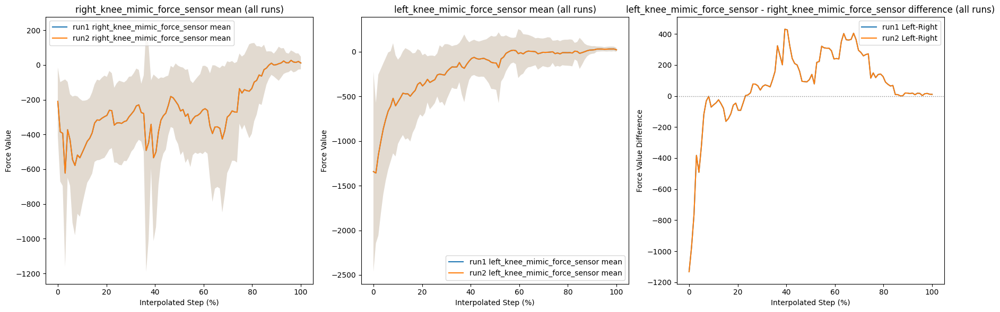

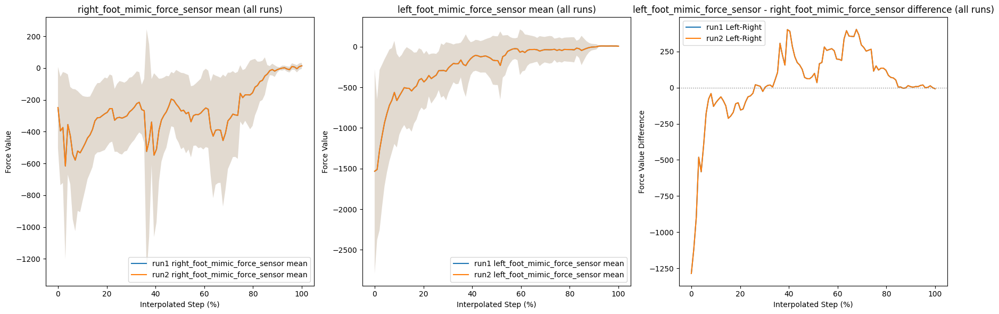

In [34]:
# def plot_sensor_force_symmetry_all_runs(all_loaded_data, run_step_data, interp_len=100, sensor_force_names=None):
#     """
#     Plot mean, std, and left-right difference for each left/right sensor force pair across all runs.
#     """
#     # Use sensor_force_names from the first run if not provided
#     if sensor_force_names is None:
#         first_run = next(iter(all_loaded_data))
#         sensor_force_names = all_loaded_data[first_run]["sensor_force_names"]

#     # Find sensor pairs (left/right)
#     sensor_pairs = []
#     for name in sensor_force_names:
#         if name.startswith("left_"):
#             right_name = name.replace("left_", "right_")
#             if right_name in sensor_force_names:
#                 sensor_pairs.append((name, right_name))

#     for left_sensor, right_sensor in sensor_pairs:
#         plt.figure(figsize=(12, 6))
#         for run_key in all_loaded_data:
#             run_dict = all_loaded_data[run_key]
#             step_data = run_step_data[run_key]
#             left_data = run_dict["all_sensor_force"][left_sensor]
#             right_data = run_dict["all_sensor_force"][right_sensor]
#             left_steps = []
#             right_steps = []
#             all_step_start_left = step_data["step_start_left"]
#             all_step_start_right = step_data["step_start_right"]

#             # Interpolate left steps
#             if all_step_start_left and len(all_step_start_left) > 1:
#                 for j in range(len(all_step_start_left) - 1):
#                     start, end = all_step_start_left[j], all_step_start_left[j + 1]
#                     y = [float(np.array(a)[1]) for a in left_data[start:end]]
#                     if len(y) < 2:
#                         continue
#                     x_old = np.linspace(0, 1, len(y))
#                     x_new = np.linspace(0, 1, interp_len)
#                     y_interp = np.interp(x_new, x_old, y)
#                     left_steps.append(y_interp)
#             # Interpolate right steps
#             if all_step_start_right and len(all_step_start_right) > 1:
#                 for j in range(len(all_step_start_right) - 1):
#                     start, end = all_step_start_right[j], all_step_start_right[j + 1]
#                     y = [float(np.array(a)[1]) for a in right_data[start:end]]
#                     if len(y) < 2:
#                         continue
#                     x_old = np.linspace(0, 1, len(y))
#                     x_new = np.linspace(0, 1, interp_len)
#                     y_interp = np.interp(x_new, x_old, y)
#                     right_steps.append(y_interp)
#             # Plot if enough steps
#             if left_steps and right_steps:
#                 mean_left = np.mean(left_steps, axis=0)
#                 std_left = np.std(left_steps, axis=0)
#                 mean_right = np.mean(right_steps, axis=0)
#                 std_right = np.std(right_steps, axis=0)
#                 diff = mean_left - mean_right
#                 x = np.linspace(0, 100, interp_len)
#                 plt.plot(x, mean_left, label=f"{run_key} {left_sensor} mean")
#                 plt.fill_between(x, mean_left - std_left, mean_left + std_left, alpha=0.15)
#                 plt.plot(x, mean_right, label=f"{run_key} {right_sensor} mean", linestyle='--')
#                 plt.fill_between(x, mean_right - std_right, mean_right + std_right, alpha=0.15)
#                 plt.plot(x, diff, label=f"{run_key} Left-Right", linestyle=':')
#         plt.axhline(0, color='gray', linestyle=':', linewidth=1)
#         plt.title(f"Force Sensor (y) per time step: {left_sensor} vs {right_sensor} (all runs)")
#         plt.xlabel("Interpolated Step (%)")
#         plt.ylabel("Force Value")
#         plt.legend()
#         plt.tight_layout()
#         plt.show()


postprocess_handler.plot_sensor_force_symmetry_all_runs(all_loaded_data, run_step_data, interp_len=100)

GRF 

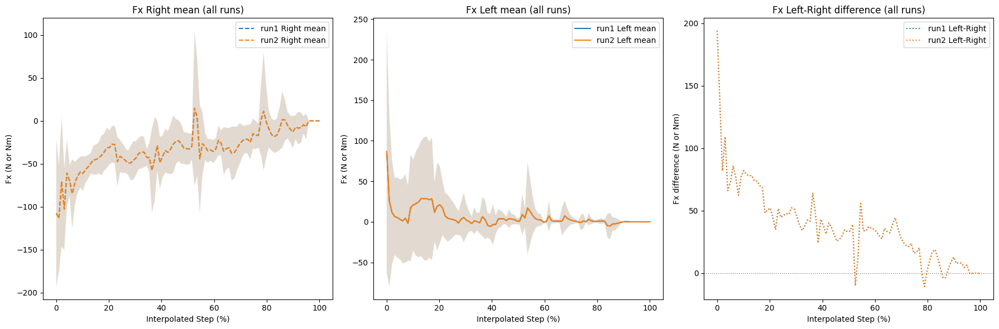

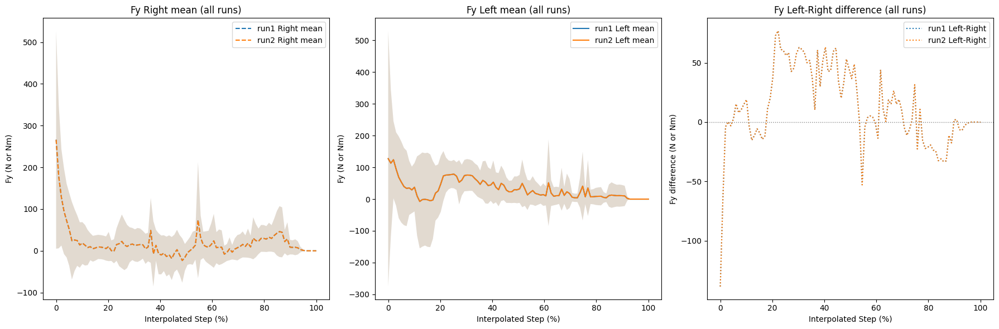

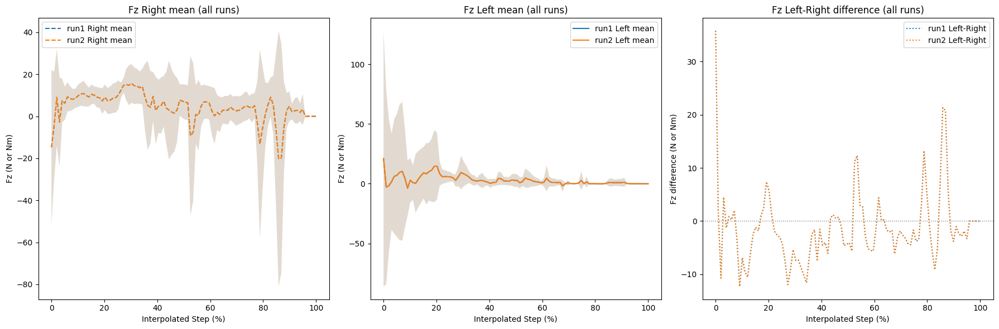

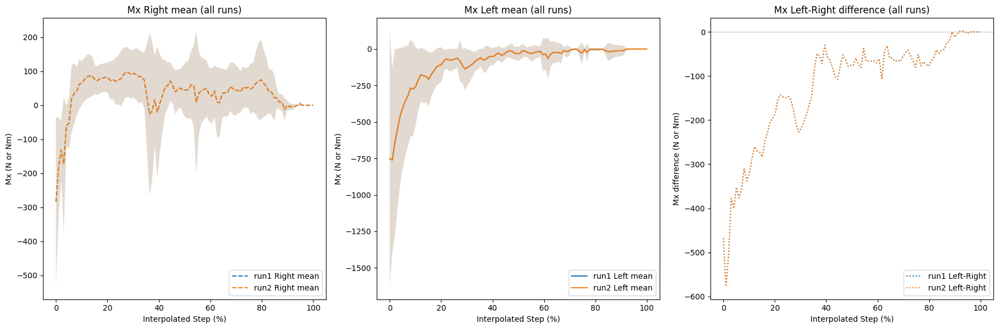

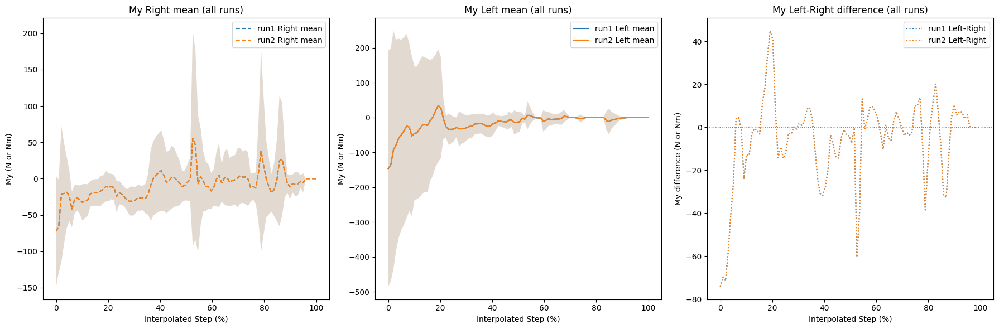

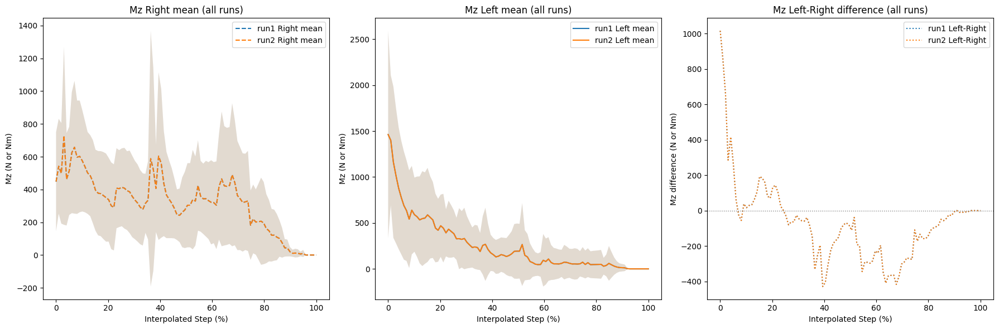

In [37]:
grf_components = ['Fx', 'Fy', 'Fz', 'Mx', 'My', 'Mz']  # Adjust if your GRF data has different columns
interp_len = 100

# for comp_idx, comp in enumerate(grf_components):
#     plt.figure(figsize=(12, 6))
#     for run_key in all_loaded_data:
#         run_dict = all_loaded_data[run_key]
#         step_data = run_step_data[run_key]
#         all_grf_l = np.array(run_dict["all_grf_l"])
#         all_grf_r = np.array(run_dict["all_grf_r"])
#         all_step_start_left = step_data["step_start_left"]
#         all_step_start_right = step_data["step_start_right"]

#         # Left steps
#         left_steps = []
#         if all_grf_l is not None and all_step_start_left and len(all_step_start_left) > 1:
#             for j in range(len(all_step_start_left) - 1):
#                 start, end = all_step_start_left[j], all_step_start_left[j + 1]
#                 y = [float(np.array(a)[comp_idx]) for a in all_grf_l[start:end]]
#                 if len(y) < 2:
#                     continue
#                 x_old = np.linspace(0, 1, len(y))
#                 x_new = np.linspace(0, 1, interp_len)
#                 y_interp = np.interp(x_new, x_old, y)
#                 left_steps.append(y_interp)
#         # Right steps
#         right_steps = []
#         if all_grf_r is not None and all_step_start_right and len(all_step_start_right) > 1:
#             for j in range(len(all_step_start_right) - 1):
#                 start, end = all_step_start_right[j], all_step_start_right[j + 1]
#                 y = [float(np.array(a)[comp_idx]) for a in all_grf_r[start:end]]
#                 if len(y) < 2:
#                     continue
#                 x_old = np.linspace(0, 1, len(y))
#                 x_new = np.linspace(0, 1, interp_len)
#                 y_interp = np.interp(x_new, x_old, y)
#                 right_steps.append(y_interp)
#         # Plot if enough steps
#         if left_steps and right_steps:
#             mean_left = np.mean(left_steps, axis=0)
#             std_left = np.std(left_steps, axis=0)
#             mean_right = np.mean(right_steps, axis=0)
#             std_right = np.std(right_steps, axis=0)
#             diff = mean_left - mean_right
#             x = np.linspace(0, 100, interp_len)
#             # Plot mean and std for left
#             plt.plot(x, mean_left, label=f"{run_key} Left mean", linestyle='-')
#             plt.fill_between(x, mean_left - std_left, mean_left + std_left, alpha=0.15)
#             # Plot mean and std for right
#             plt.plot(x, mean_right, label=f"{run_key} Right mean", linestyle='--')
#             plt.fill_between(x, mean_right - std_right, mean_right + std_right, alpha=0.15)
#             # Plot difference
#             plt.plot(x, diff, label=f"{run_key} Left-Right", linestyle=':')
#     plt.axhline(0, color='gray', linestyle=':', linewidth=1)
#     plt.title(f"GRF {comp}: mean, std, and difference per time step (all runs)")
#     plt.xlabel("Interpolated Step (%)")
#     plt.ylabel(f"{comp} (N or Nm)")
#     plt.legend()
#     plt.tight_layout()
#     plt.show()

postprocess_handler.plot_grf_component_symmetry_all_runs(
        grf_components,
        all_loaded_data,
        run_step_data,
        interp_len=100,
    )

Joint kinematics 

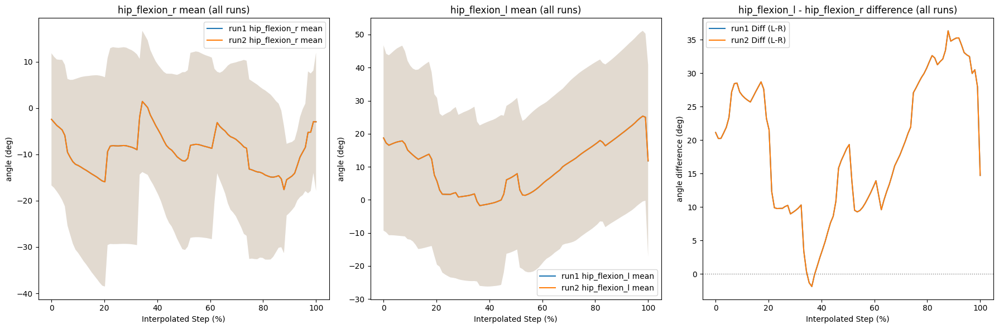

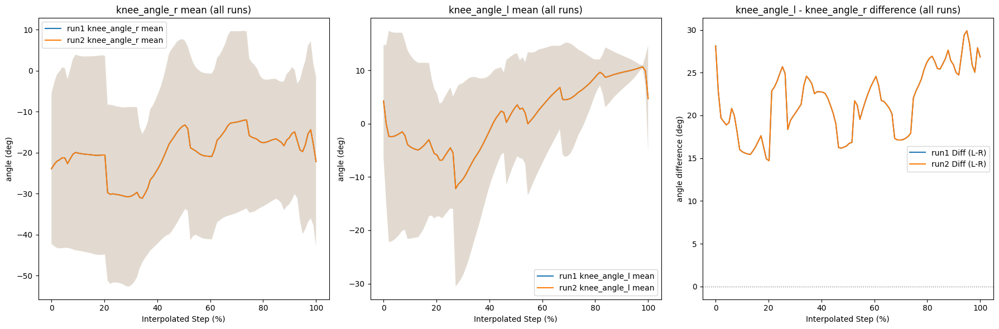

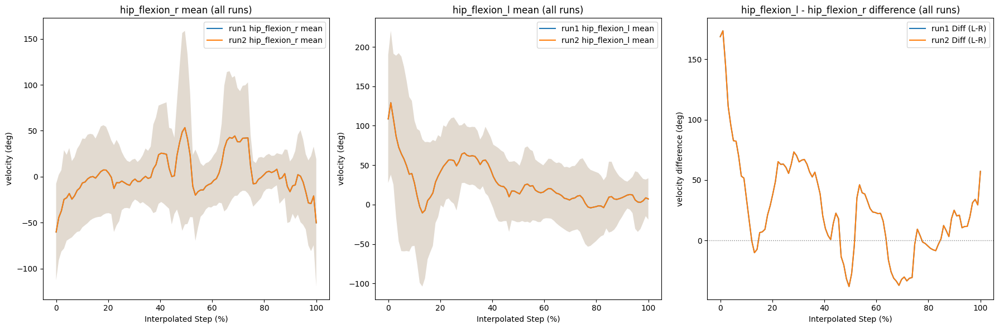

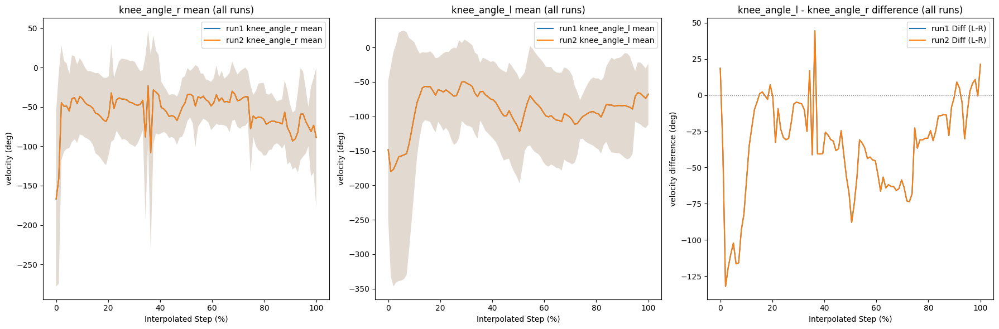

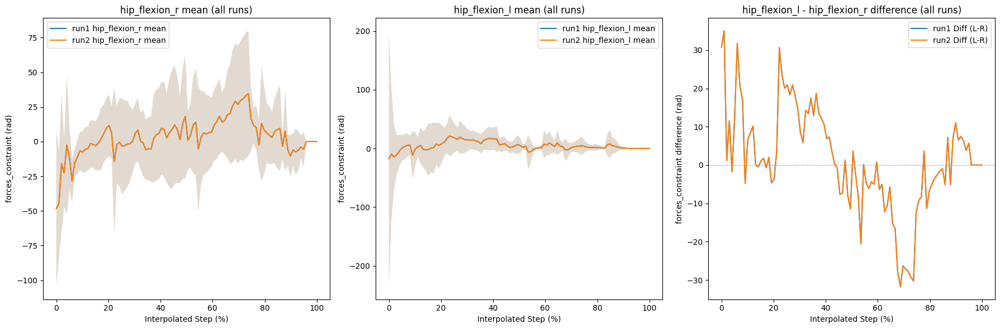

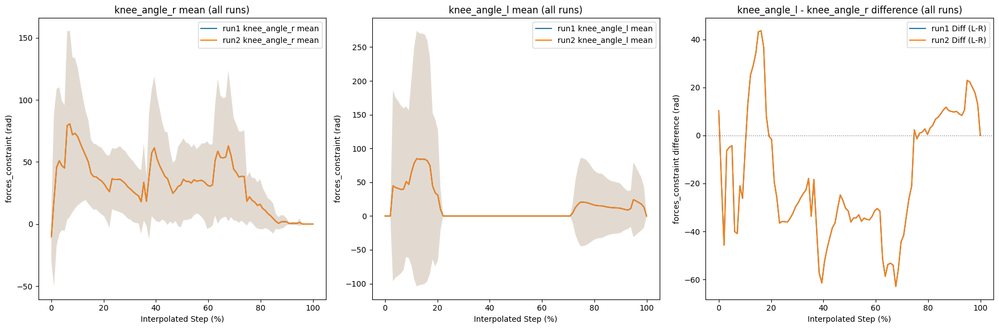

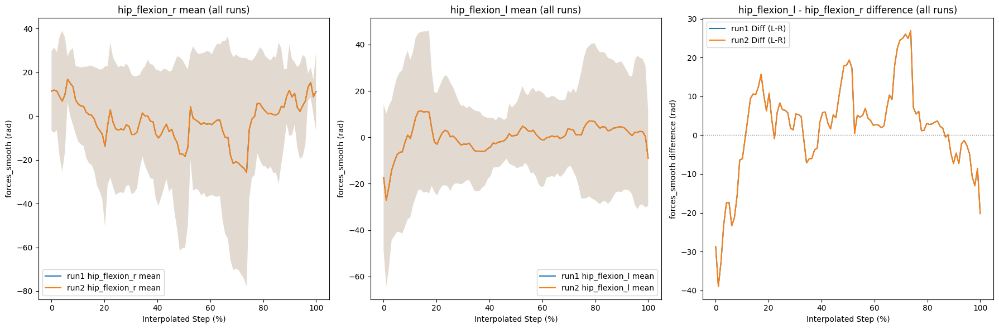

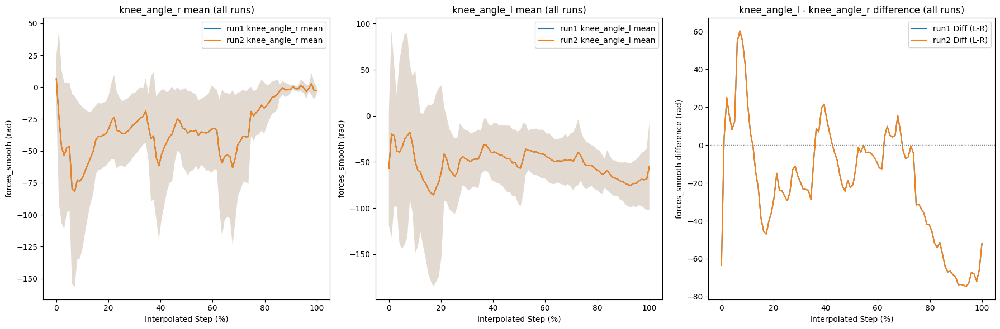

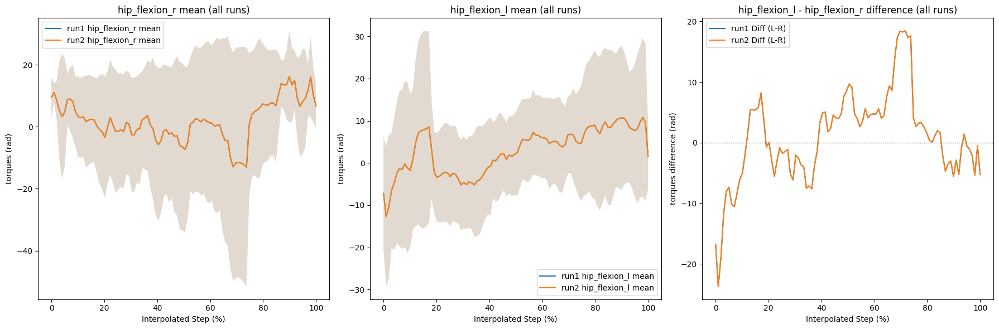

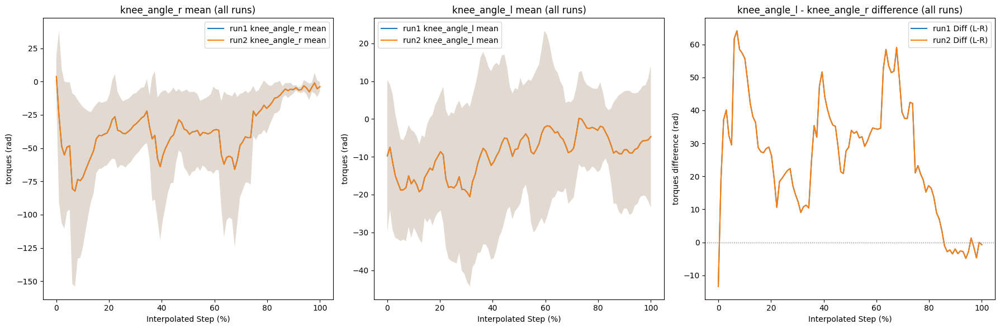

In [32]:
joint_names_list = ['hip_flexion', 'knee_angle', 'ankle_angle', 'subtalar_angle', 'mtp_angle']  # List of joint base names
# plot angle
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="angle",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
)   


# plot velocity 
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="velocity",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
)

# plot forces_constraint    
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_constraint",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# force_smooth 
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_smooth",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# torques
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="torques",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)



Muscle activation

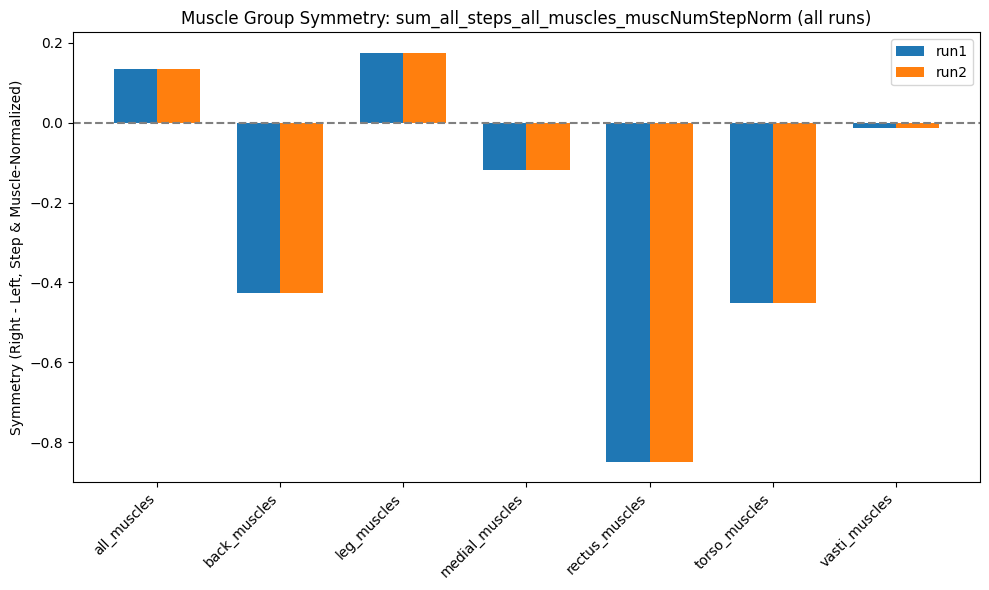

In [31]:
# Muscle activation symmetry (right - left) for each muscle group, for all runs, side-by-side bars


all_run_keys = list(all_loaded_data.keys())
# Get all muscle groups that appear as _left/_right in any run
all_muscle_groups = set()
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations")
    if act is not None:
        mg = list(act.keys())
        all_muscle_groups.update([g.replace('_left', '') for g in mg if g.endswith('_left') and g.replace('_left', '_right') in mg])
all_muscle_groups = sorted(all_muscle_groups)

# Collect symmetry values for each run
symmetry_matrix = []
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations")
    vals = []
    for base in all_muscle_groups:
        left = act.get(f"{base}_left") if act else None
        right = act.get(f"{base}_right") if act else None
        # Convert to scalar
        if isinstance(left, tuple):
            left = left[0]
        if hasattr(left, "item"):
            left = left.item()
        if isinstance(right, tuple):
            right = right[0]
        if hasattr(right, "item"):
            right = right.item()
        if left is not None and right is not None:
            vals.append(right - left)
        else:
            vals.append(np.nan)
    symmetry_matrix.append(vals)

symmetry_matrix = np.array(symmetry_matrix)  # shape: (n_runs, n_groups)

# Plot side-by-side bars
bar_width = 0.35
x = np.arange(len(all_muscle_groups))
plt.figure(figsize=(10, 6))
for i, run_key in enumerate(all_run_keys):
    plt.bar(x + i * bar_width, symmetry_matrix[i], width=bar_width, label=run_key)
plt.axhline(0, color='gray', linestyle='--')
plt.xticks(x + bar_width * (len(all_run_keys)-1)/2, all_muscle_groups, rotation=45, ha='right')
plt.ylabel("Symmetry (Right - Left, Step & Muscle-Normalized)")
plt.title("Muscle Group Symmetry: sum_all_steps_all_muscles_muscNumStepNorm (all runs)")
plt.legend()
plt.tight_layout()
plt.show()

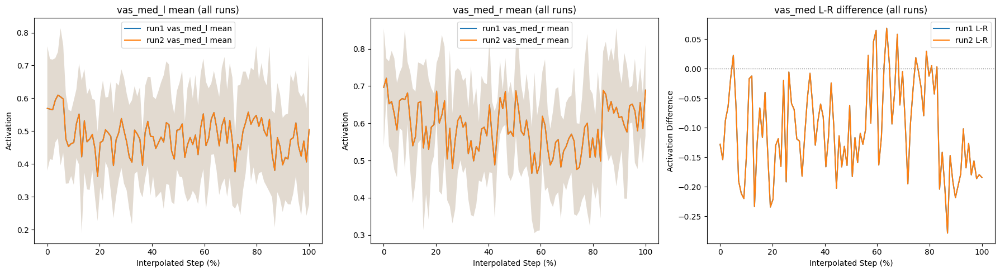

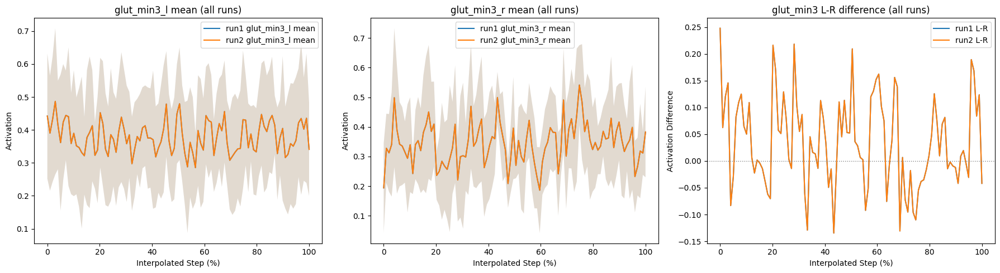

In [30]:
muscle_names_list = ['vas_med', 'glut_min3']  # List of muscle base names to plot
postprocess_handler.plot_muscle_activation_symmetry_all_runs(
    muscle_names_list,
    all_loaded_data,
    run_step_data,
    interp_len=100,
)


# Pertubation forces

Loaded data: dict_keys([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300])


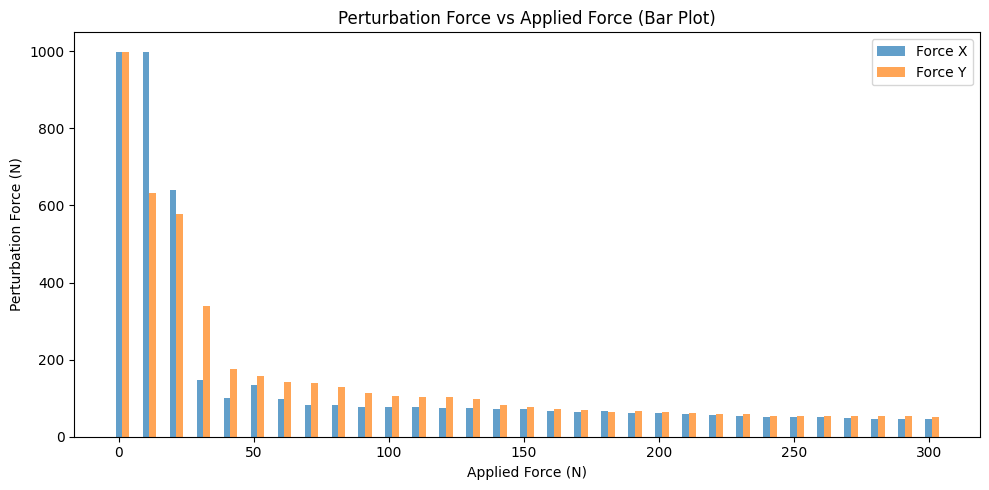

In [38]:
perturb_path = "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250617_003316_perturbation_force_time.pkl"


with open(perturb_path, "rb") as f:
    perturb_data = pickle.load(f)
    print(f"Loaded data: {perturb_data.keys()}")  # Print the keys of the loaded data to verify

force_min = 0 
force_max = 301 
force_increment = 10
force_direction = ['x', 'y']  #, 'z']  # Specify the force directions you want to plot
force_range = np.arange(force_min, force_max, force_increment)  


force_sort = {}
# Collect force values for each direction over the force_range
for d in force_direction: #, 'z']:
    force_sort[d] = [perturb_data[f][d] if f in perturb_data and d in perturb_data[f] else np.nan for f in force_range]

# Plot the perturbation forces for each direction as bar plots
plt.figure(figsize=(10, 5))
bar_width = 2.5  # width of each bar

for idx, (d, label, color) in enumerate(zip(force_direction, ['Force X', 'Force Y', 'Force Z'], ['tab:blue', 'tab:orange', 'tab:green'])):
    plt.bar(force_range + idx * bar_width, force_sort[d], width=bar_width, label=label, alpha=0.7, color=color)

plt.xlabel("Applied Force (N)")
plt.ylabel("Perturbation Force (N)")
plt.title("Perturbation Force vs Applied Force (Bar Plot)")
plt.legend()
plt.tight_layout()
plt.show()


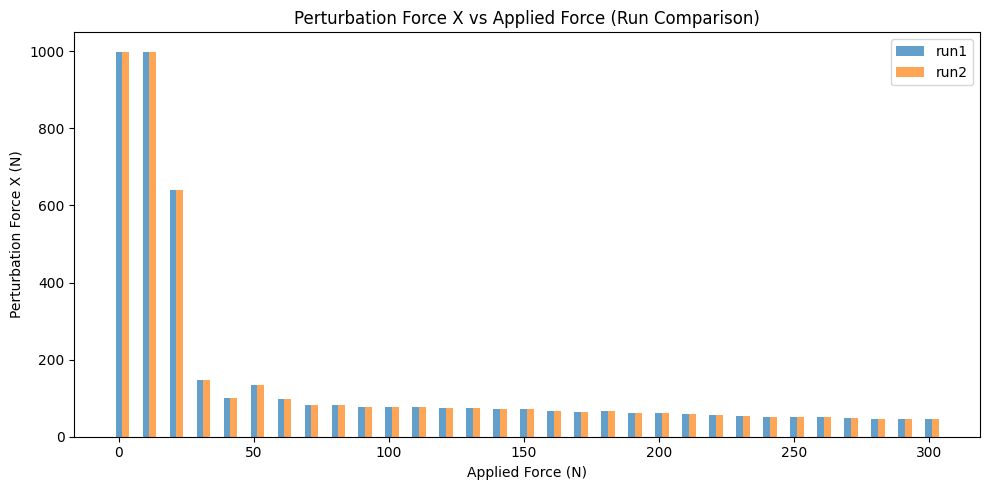

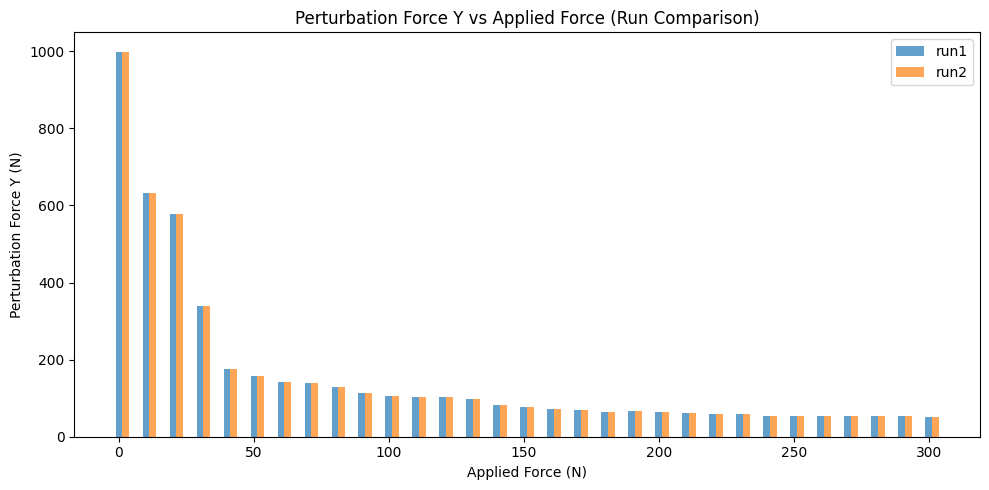

In [3]:
# print("Loading perturbation data...")
perturb_file = {}

# Fix missing comma in perturb_path
perturb_path = {
    'run1': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250617_003316_perturbation_force_time.pkl",
    'run2': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250617_003316_perturbation_force_time.pkl"
}

# print("Perturb_path", perturb_path)

for run_name, path in perturb_path.items():
    # print(f"Loading data for {run_name} from {path}")
    with open(path, "rb") as f:
        perturb_file[run_name] = pickle.load(f)
    # print(f"Loaded data for {run_name}: {perturb_file[run_name].keys()}")  # Print the keys of the loaded data to verify

force_min = 0 
force_max = 301 
force_increment = 10
force_range = np.arange(force_min, force_max, force_increment)  

# Plot all x for all runs in one plot
plt.figure(figsize=(10, 5))
bar_width = 2.5  # width of each bar
colors = ['tab:blue', 'tab:orange']

for idx, (run_name, color) in enumerate(zip(perturb_file.keys(), colors)):
    perturb_data = perturb_file[run_name]
    force_x = [perturb_data[f]['x'] if f in perturb_data and 'x' in perturb_data[f] else np.nan for f in force_range]
    plt.bar(force_range + idx * bar_width, force_x, width=bar_width, label=run_name, alpha=0.7, color=color)

plt.xlabel("Applied Force (N)")
plt.ylabel("Perturbation Force X (N)")
plt.title("Perturbation Force X vs Applied Force (Run Comparison)")
plt.legend()
plt.tight_layout()
plt.savefig("/home/nadinebadie/loco-mujoco/prosthesis_test/perturbation_force_comparison_x.png")
plt.show()

# Plot all y for all runs in a second plot
plt.figure(figsize=(10, 5))

for idx, (run_name, color) in enumerate(zip(perturb_file.keys(), colors)):
    perturb_data = perturb_file[run_name]
    force_y = [perturb_data[f]['y'] if f in perturb_data and 'y' in perturb_data[f] else np.nan for f in force_range]
    plt.bar(force_range + idx * bar_width, force_y, width=bar_width, label=run_name, alpha=0.7, color=color)

plt.xlabel("Applied Force (N)")
plt.ylabel("Perturbation Force Y (N)")
plt.title("Perturbation Force Y vs Applied Force (Run Comparison)")
plt.legend()
plt.tight_layout()
plt.savefig("/home/nadinebadie/loco-mujoco/prosthesis_test/perturbation_force_comparison_y.png")
plt.show()